# Libraries

In [367]:
import numpy as np
import pandas as pd
from pandasql import sqldf
pysqldf = lambda q: sqldf(q, globals())

import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, date
from  sklearn.impute import KNNImputer

# Load Data

In [368]:
# polutan_1 = pd.read_csv('../Pollutants/2021 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
# polutan_2 = pd.read_csv('../Pollutants/2022 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
polutan_3 = pd.read_csv('../Pollutants/2023 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')
polutan_4 = pd.read_csv('../Pollutants/2024 - Indeks Standar Pencemaran Udara (ISPU).csv', sep=';', decimal='.')

cuaca_kemayoran = pd.read_csv('../Meteorological Kemayoran/kemayoran 2021 - 2024.csv', sep=';', decimal='.')
cuaca_tanjung_priok = pd.read_csv('../Meteorological Tanjung Priok/tanjung priok 2021-2024.csv', sep=';', decimal='.')

# DKI 1: Bundaran HI (Jakarta Pusat)
# DKI 2: Kelapa Gading (Jakarta Utara)
# DKI 3: Jagakarsa (Jakarta Selatan)
# DKI 4: Lubang buaya (Jakarta Timur)
# DKI 5: Kebon Jeruk (Jakarta Barat)

# Preprocessing Data

Processing Data mencakup:
1. Data Polutan
    - menyamakan format data kosong ke None
    - Memasukkan data polutan per DKI ke axis kolom, agar tidak ada baris tanggal yang duplikat dan agar bisa digabungkan dengan data cuaca
2. Data Cuaca

beberapa yang preprocess manual:

2021
1. Rename value kolom stasiun
    - DKI1 (Bundaran HI) -> DKI1
    - DKI2 (Kelapa Gading) -> DKI2
    - DKI3 (Jagakarsa) -> DKI3
    - DKI4 (Lubang buaya) -> DKI4
    - DKI5 (Kebon Jeruk) -> DKI5

2022
1. lokasi_spku -> stasiun
2. typo pada periode 202202, tahun 2020 -> 2022

2023
1. Rename value kolom stasiun:
    - DKI5 Kebon Jeruk Jakarta Barat & DKI5 Kebon Jeruk -> DKI5
    - DKI1 Bunderan HI -> DKI1
    - DKI2 Kelapa Gading -> DKI2
    - DKI3 Jagakarsa -> DKI3
    - DKI4 Lubang Buaya -> DKI4
2. Rename value parameter pencemar kritis
    - 2 -> PM25
    - 1 -> PM10
    - 5 -> O3
    - 3 -> SO2
3. typo pada periode 202212 -> 202312, 2022 -> 2023

2024
1. Rename value kolom stasiun:
    - DKI5 Kebon Jeruk Jakarta Barat & DKI5 Kebon Jeruk -> DKI5
    - DKI1 Bunderan HI & DKI1 Bundaran Hotel Indonesia (HI) -> DKI1
    - DKI2 Kelapa Gading -> DKI2
    - DKI3 Jagakarsa -> DKI3
    - DKI4 Lubang Buaya -> DKI4

In [369]:
example = np.cos(0), np.sin(0)
example

(np.float64(1.0), np.float64(0.0))

## Data Meteorologi

Arah Angin

- (1) C: Calm
- (2) N: North
- (3) NE: North East
- (4) E: East
- (5) SE: South East
- (6) S: South
- (7) SW: South West
- (8) W: West
- (9) NW: North West

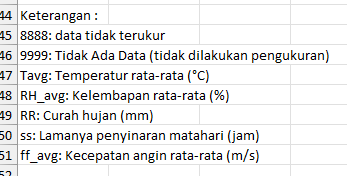

data di 23 oktober 2023 completely blank, use other imputation method

### Kemayoran

In [370]:
# cuaca_kemayoran = cuaca_kemayoran.drop(1440)
cuaca_kemayoran = cuaca_kemayoran.drop(columns=['lat', 'long', 'elevation'])

In [371]:
for i in range(len(cuaca_kemayoran['Tanggal'])):
  cuaca_kemayoran.loc[i, 'Tanggal'] = datetime.strptime(cuaca_kemayoran['Tanggal'][i], '%d-%m-%Y').date()

In [372]:
cuaca_kemayoran = cuaca_kemayoran[cuaca_kemayoran['Tanggal'] >= date(2023, 1, 1)]
cuaca_kemayoran = cuaca_kemayoran.reset_index(drop=True)
cuaca_kemayoran

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,"26,3",87.0,"14,5",0,1.0,C
1,2023-01-02,"27,5",81.0,"31,5","0,7",2.0,NW
2,2023-01-03,"26,6",82.0,"0,5",0,1.0,C
3,2023-01-04,"26,4",86.0,"2,4",NaN,1.0,C
4,2023-01-05,"27,4",83.0,"35,3",NaN,2.0,C
...,...,...,...,...,...,...,...
726,2024-12-27,"29,2",78.0,-,"1,2",2.0,C
727,2024-12-28,30,70.0,-,"3,8",2.0,C
728,2024-12-29,"29,7",73.0,-,3,1.0,C
729,2024-12-30,"28,4",76.0,1,"1,8",2.0,SW


In [373]:
cuaca_kemayoran[cuaca_kemayoran['Tanggal'] <= date(2024, 10, 31)]

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,"26,3",87.0,"14,5",0,1.0,C
1,2023-01-02,"27,5",81.0,"31,5","0,7",2.0,NW
2,2023-01-03,"26,6",82.0,"0,5",0,1.0,C
3,2023-01-04,"26,4",86.0,"2,4",NaN,1.0,C
4,2023-01-05,"27,4",83.0,"35,3",NaN,2.0,C
...,...,...,...,...,...,...,...
665,2024-10-27,"30,1",71.0,0,8,2.0,C
666,2024-10-28,"30,2",67.0,0,8,1.0,C
667,2024-10-29,"30,8",69.0,0,"0,6",1.0,C
668,2024-10-30,"30,9",65.0,0,"6,5",1.0,C


In [374]:
cuaca_kemayoran[['Tavg', 'RR', 'ss']] = cuaca_kemayoran[['Tavg', 'RR', 'ss']].apply(lambda x: x.str.replace(',','.'))

In [375]:
cuaca_kemayoran[['RR', 'ss']] = cuaca_kemayoran[['RR', 'ss']].replace('-', np.nan)
cuaca_kemayoran[['Tavg', 'RR', 'ss']] = cuaca_kemayoran[['Tavg', 'RR', 'ss']].astype(float)

In [376]:
cuaca_kemayoran['DDD_CAR'].unique()

array(['C ', 'NW', 'W ', 'S ', 'E ', nan, 'SW', 'C', 'E', 'N', 'W'],
      dtype=object)

In [377]:
cuaca_kemayoran['DDD_CAR'] = cuaca_kemayoran['DDD_CAR'].str.strip()
cuaca_kemayoran['DDD_CAR'].unique()

array(['C', 'NW', 'W', 'S', 'E', nan, 'SW', 'N'], dtype=object)

In [378]:
# manual label encoding
cuaca_kemayoran['DDD_CAR'] = cuaca_kemayoran['DDD_CAR'].replace({
  'C': 1,
  'N': 2,
  'NE': 3,
  'E': 4,
  'SE': 5,
  'S': 6,
  'SW': 7,
  'W': 8,
  'NW': 9
})

In [379]:
cuaca_kemayoran_processed = cuaca_kemayoran.copy()

In [380]:
cuaca_kemayoran_processed

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0
1,2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0
2,2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0
3,2023-01-04,26.4,86.0,2.4,NaN,1.0,1.0
4,2023-01-05,27.4,83.0,35.3,NaN,2.0,1.0
...,...,...,...,...,...,...,...
726,2024-12-27,29.2,78.0,NaN,1.2,2.0,1.0
727,2024-12-28,30.0,70.0,NaN,3.8,2.0,1.0
728,2024-12-29,29.7,73.0,NaN,3.0,1.0,1.0
729,2024-12-30,28.4,76.0,1.0,1.8,2.0,7.0


#### Missing Values

In [381]:
pysqldf(""" select 
        count(*) 
        from cuaca_kemayoran
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
""")

,count(*)
0,200


In [382]:
pysqldf(""" select 
        *
        from cuaca_kemayoran
        where Tavg is null and
        RH_avg is null and
        RR is null and
        ss is null and
        ff_avg is null
""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-23,None,None,None,None,None,None


In [383]:
cuaca_kemayoran_processed = cuaca_kemayoran_processed.replace([9999.0, 8888.0], np.nan)

total row: 1440

rows contain null: 434

30.14% data null

#### EDA Univariate

In [384]:
cuaca_kemayoran_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Tanggal  731 non-null    object 
 1   Tavg     726 non-null    float64
 2   RH_avg   728 non-null    float64
 3   RR       538 non-null    float64
 4   ss       720 non-null    float64
 5   ff_avg   730 non-null    float64
 6   DDD_CAR  730 non-null    float64
dtypes: float64(6), object(1)
memory usage: 40.1+ KB


In [385]:
cuaca_kemayoran_processed = cuaca_kemayoran_processed.set_index('Tanggal')

In [386]:
cuaca_kemayoran_processed.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,726.000000,728.000000,538.000000,720.000000,730.000000,730.000000
mean,29.013774,74.961538,7.099257,4.441667,1.157534,1.526027
std,1.086990,6.512597,16.013209,2.593012,0.572439,1.705315
min,24.800000,56.000000,0.000000,0.000000,0.000000,1.000000
25%,28.400000,71.000000,0.000000,2.400000,1.000000,1.000000
50%,29.100000,75.000000,0.000000,4.800000,1.000000,1.000000
75%,29.700000,79.000000,4.450000,6.700000,1.000000,1.000000
max,31.800000,94.000000,140.900000,9.900000,3.000000,9.000000


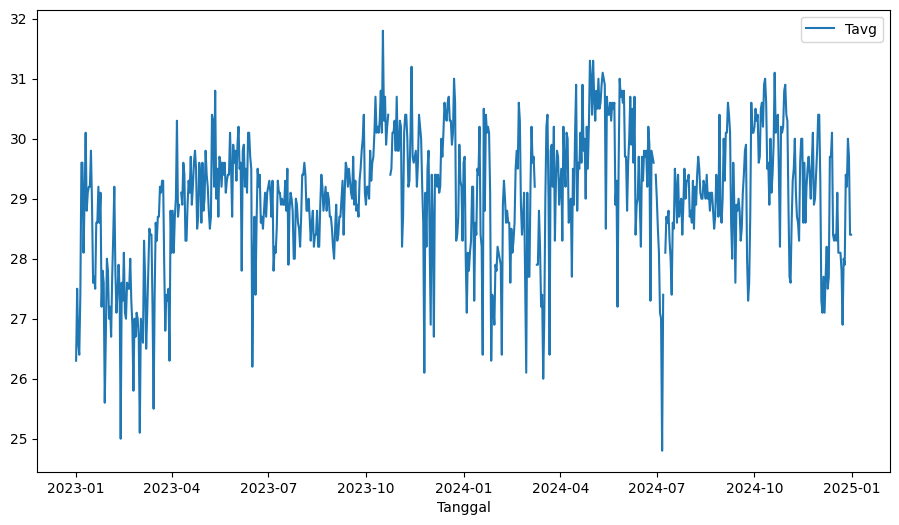

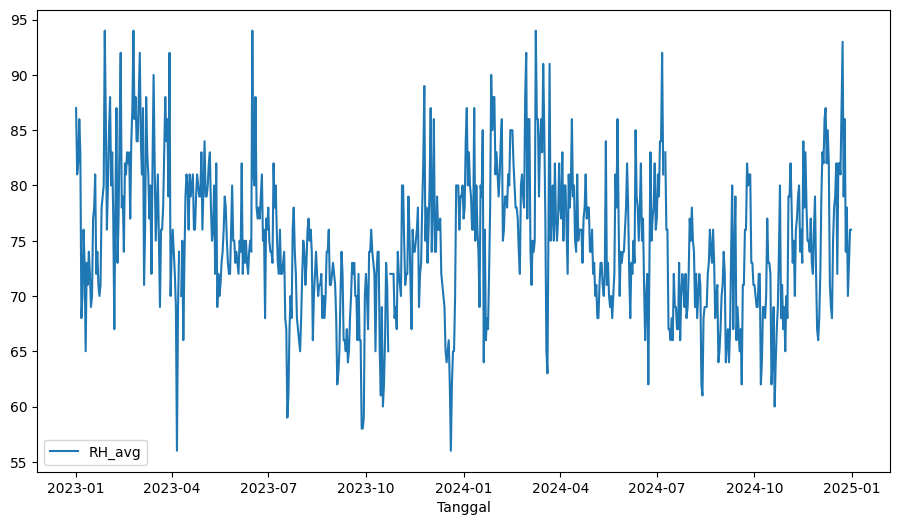

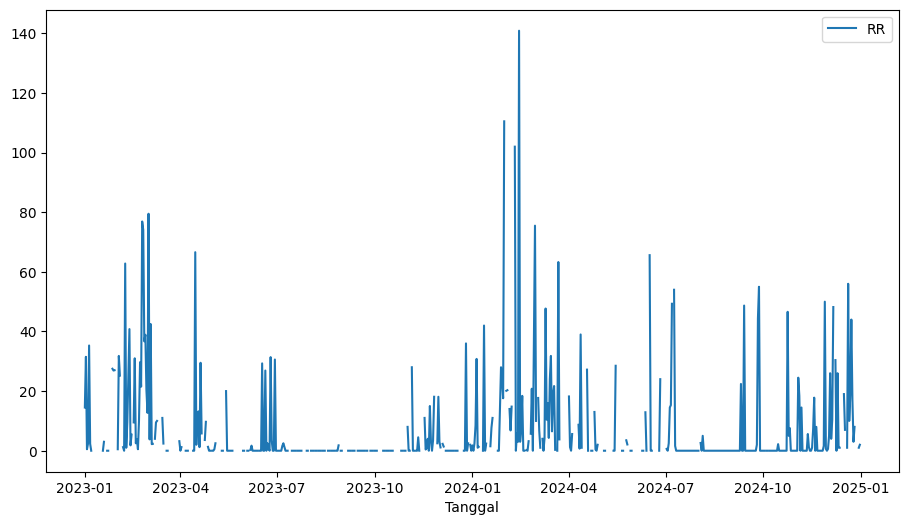

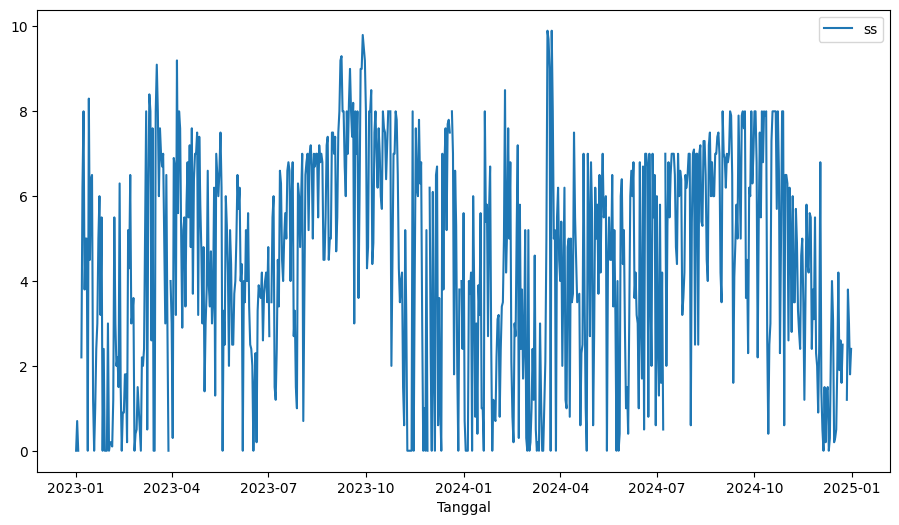

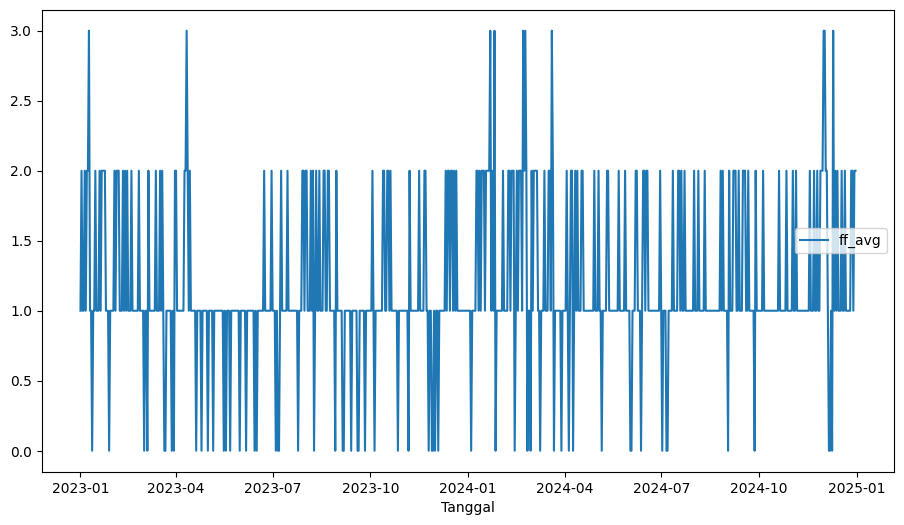

In [387]:
cuaca_kemayoran_processed.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

cuaca_kemayoran_processed.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

cuaca_kemayoran_processed.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

cuaca_kemayoran_processed.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

cuaca_kemayoran_processed.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

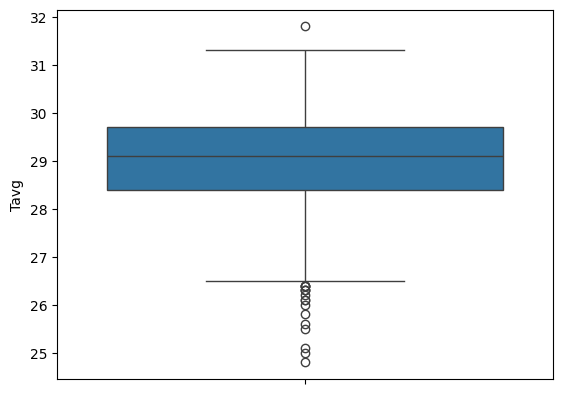

In [388]:
sns.boxplot(y=cuaca_kemayoran_processed['Tavg'])
plt.show()

Text(0, 0.5, 'counts')

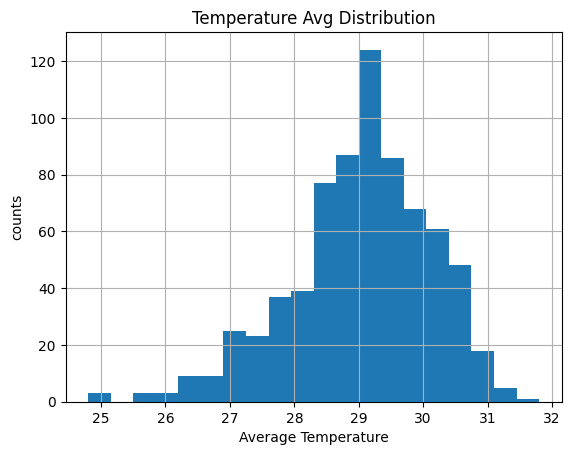

In [389]:
cuaca_kemayoran_processed['Tavg'].hist(bins = 20)
plt.title('Temperature Avg Distribution')
plt.xlabel('Average Temperature')
plt.ylabel('counts')

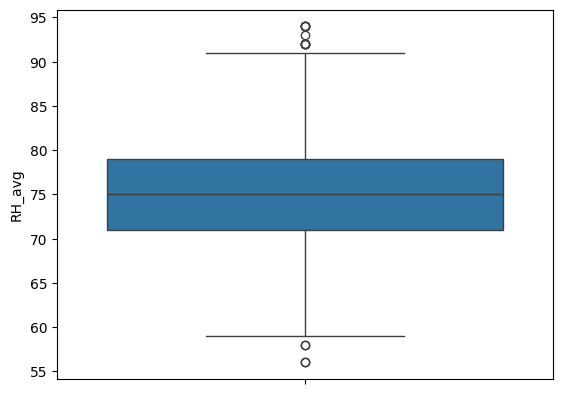

In [390]:
sns.boxplot(y=cuaca_kemayoran_processed['RH_avg'])
plt.show()

Text(0, 0.5, 'count')

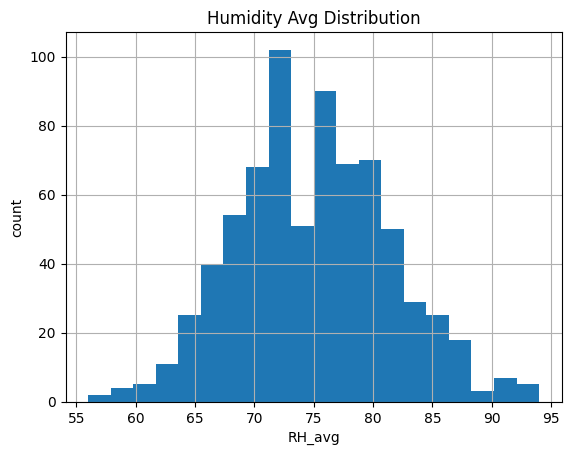

In [391]:
cuaca_kemayoran_processed['RH_avg'].hist(bins = 20)
plt.title('Humidity Avg Distribution')
plt.xlabel('RH_avg')
plt.ylabel('count')

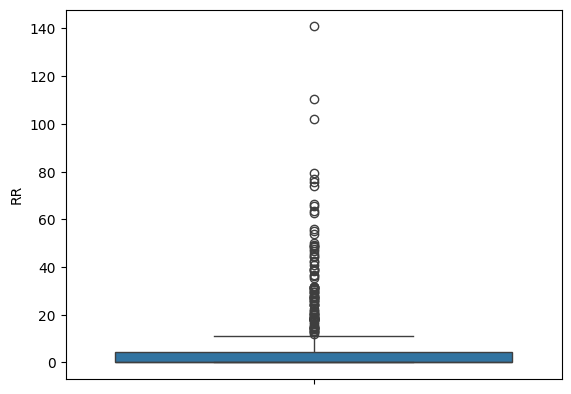

In [392]:
sns.boxplot(y=cuaca_kemayoran_processed['RR'])
plt.show()

Text(0, 0.5, 'count')

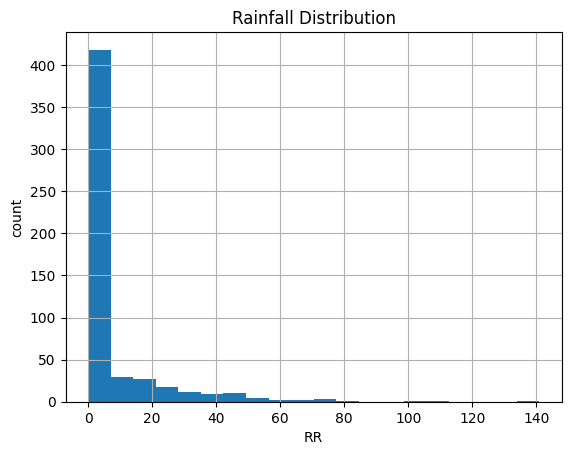

In [393]:
cuaca_kemayoran_processed['RR'].hist(bins = 20)
plt.title('Rainfall Distribution')
plt.xlabel('RR')
plt.ylabel('count')

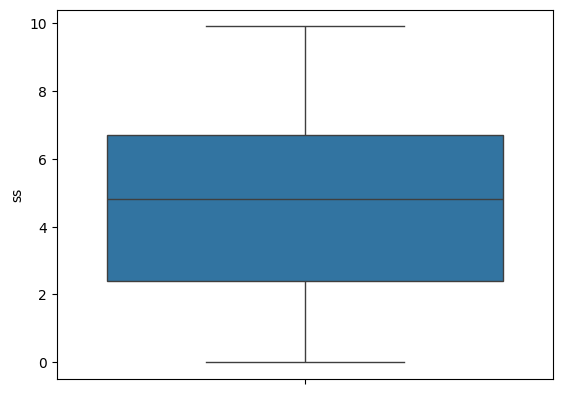

In [394]:
sns.boxplot(y=cuaca_kemayoran_processed['ss'])
plt.show()

Text(0, 0.5, 'count')

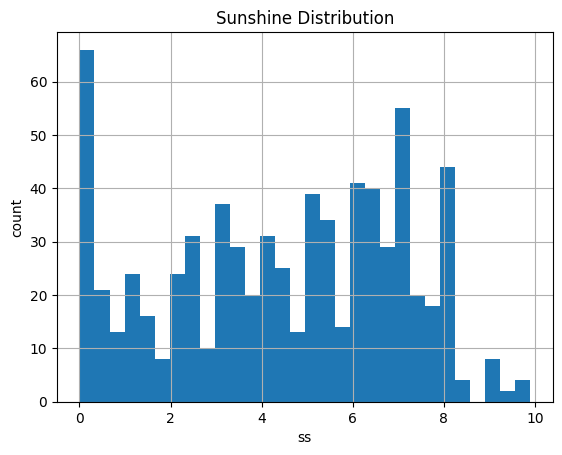

In [395]:
cuaca_kemayoran_processed['ss'].hist(bins = 30)
plt.title('Sunshine Distribution')
plt.xlabel('ss')
plt.ylabel('count')

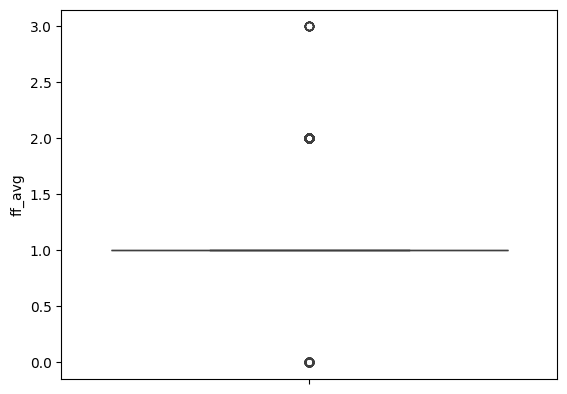

In [396]:
sns.boxplot(y=cuaca_kemayoran_processed['ff_avg'])
plt.show()

Text(0, 0.5, 'count')

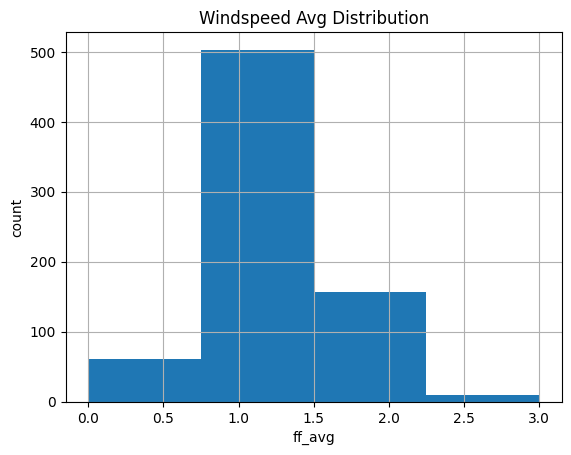

In [397]:
cuaca_kemayoran_processed['ff_avg'].hist(bins = 4)
plt.title('Windspeed Avg Distribution')
plt.xlabel('ff_avg')
plt.ylabel('count')

TRENDS
- tren Tavg semakin naik
- tren RH_avg cenderung semakin turun

DISTRIBUTIONS:
- Tavg & RH_avg mempunyai bentuk distribusi normal yang sedikit right skew

#### EDA Bivariate

In [398]:
list(cuaca_kemayoran_processed[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].columns)

['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']

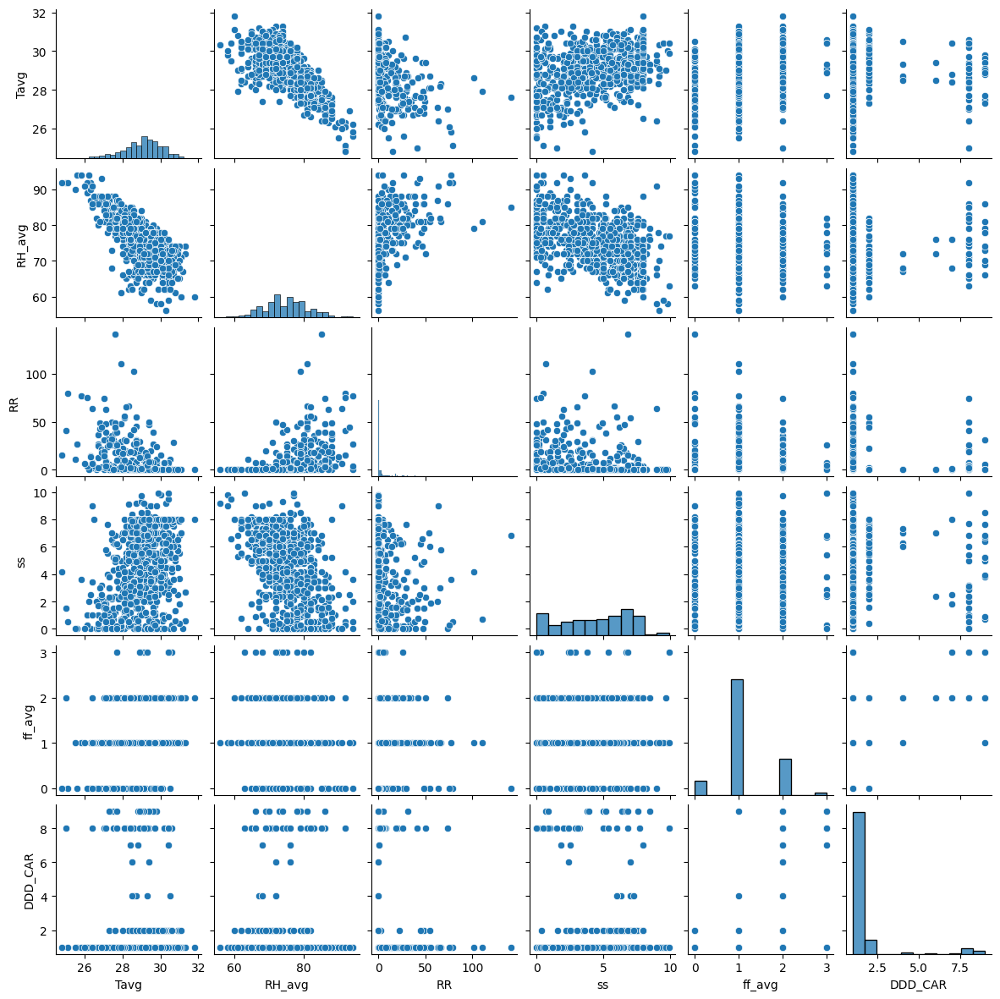

In [399]:
sns.pairplot(cuaca_kemayoran_processed, height=2)

Temperature
- LOWER Temperature - HIGHER Humidity
- LOWER Temperature - cenderung HIGHER Rainfall
- HIGHER Temperature - cendurung HIGHER Sunshine

Humidity
- HIGHER Humidity - cenderung HIGHER Rainfall
- HIGHER Humidity - cenderung LOWER sunshine

Else is hard to see the correlation

#### Impute Data

In [400]:
cuaca_kemayoran_processed

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
Tanggal,,,,,,
2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0
2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0
2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0
2023-01-04,26.4,86.0,2.4,NaN,1.0,1.0
2023-01-05,27.4,83.0,35.3,NaN,2.0,1.0
...,...,...,...,...,...,...
2024-12-27,29.2,78.0,NaN,1.2,2.0,1.0
2024-12-28,30.0,70.0,NaN,3.8,2.0,1.0
2024-12-29,29.7,73.0,NaN,3.0,1.0,1.0


In [401]:
# KNN
imputer = KNNImputer()
imputed_cuaca_kemayoran = pd.concat(
  [
    pd.DataFrame({
      'Tanggal': cuaca_kemayoran['Tanggal']
    }),
    pd.DataFrame(imputer.fit_transform(cuaca_kemayoran_processed),columns = ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR'])
  ], axis=1
)

In [402]:
imputed_cuaca_kemayoran

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,26.3,87.0,14.50,0.00,1.0,1.0
1,2023-01-02,27.5,81.0,31.50,0.70,2.0,9.0
2,2023-01-03,26.6,82.0,0.50,0.00,1.0,1.0
3,2023-01-04,26.4,86.0,2.40,2.12,1.0,1.0
4,2023-01-05,27.4,83.0,35.30,4.94,2.0,1.0
...,...,...,...,...,...,...,...
726,2024-12-27,29.2,78.0,7.52,1.20,2.0,1.0
727,2024-12-28,30.0,70.0,0.64,3.80,2.0,1.0
728,2024-12-29,29.7,73.0,0.00,3.00,1.0,1.0
729,2024-12-30,28.4,76.0,1.00,1.80,2.0,7.0


In [403]:
imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].round(1)
imputed_cuaca_kemayoran[['RH_avg', 'DDD_CAR']] = imputed_cuaca_kemayoran[['RH_avg', 'DDD_CAR']].round(0)

In [404]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_kemayoran where Tanggal in ('2023-10-20', '2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25', '2023-10-26')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-20,29.9,73.0,6.5,6.4,2.0,1.0
1,2023-10-21,30.2,71.0,0.0,7.2,1.0,1.0
2,2023-10-22,30.4,65.0,0.0,8.0,1.0,1.0
3,2023-10-23,29.0,75.0,7.1,4.4,1.2,2.0
4,2023-10-24,29.4,72.0,0.0,8.0,1.0,1.0
5,2023-10-25,29.5,72.0,0.4,2.0,1.0,1.0
6,2023-10-26,30.1,72.0,0.0,4.4,1.0,1.0


In [405]:
# Linear Interpolation
imputed_cuaca_kemayoran.loc[imputed_cuaca_kemayoran['Tanggal'] == datetime.strptime('23-10-2023', '%d-%m-%Y').date(), ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = np.nan
imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_kemayoran[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].interpolate(method ='linear', limit_direction ='forward')

In [406]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_kemayoran where Tanggal in ('2023-10-20', '2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25', '2023-10-26')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-20,29.9,73.0,6.5,6.4,2.0,1.0
1,2023-10-21,30.2,71.0,0.0,7.2,1.0,1.0
2,2023-10-22,30.4,65.0,0.0,8.0,1.0,1.0
3,2023-10-23,29.9,68.5,0.0,8.0,1.0,1.0
4,2023-10-24,29.4,72.0,0.0,8.0,1.0,1.0
5,2023-10-25,29.5,72.0,0.4,2.0,1.0,1.0
6,2023-10-26,30.1,72.0,0.0,4.4,1.0,1.0


In [407]:
# imputed_cuaca_kemayoran = imputed_cuaca_kemayoran.set_index(imputed_cuaca_kemayoran['Tanggal'])

#### EDA After Cleaning & Preprocess

In [408]:
imputed_cuaca_kemayoran.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,29.010807,74.954172,6.537483,4.451984,1.157319,1.525308
std,1.089215,6.504131,14.366142,2.590828,0.572077,1.704258
min,24.800000,56.000000,0.000000,0.000000,0.000000,1.000000
25%,28.400000,71.000000,0.000000,2.400000,1.000000,1.000000
50%,29.100000,75.000000,0.200000,4.800000,1.000000,1.000000
75%,29.700000,79.000000,5.650000,6.700000,1.000000,1.000000
max,31.800000,94.000000,140.900000,9.900000,3.000000,9.000000


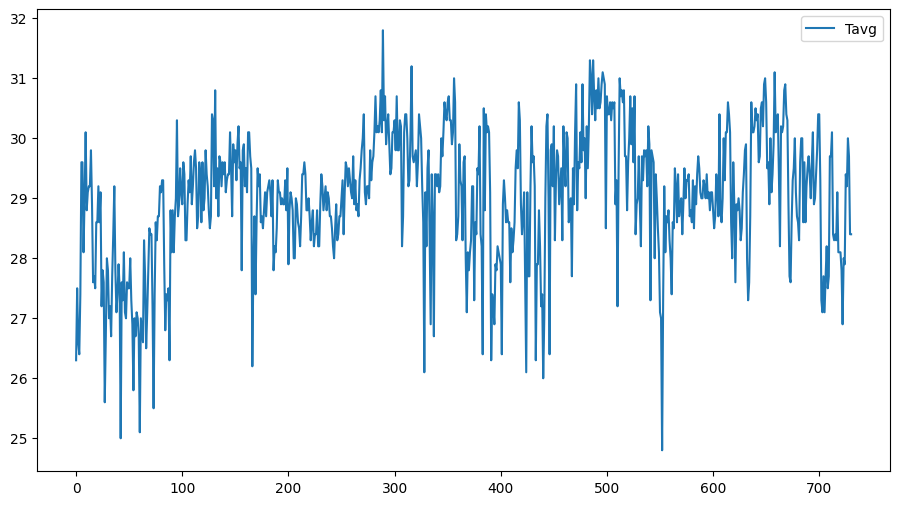

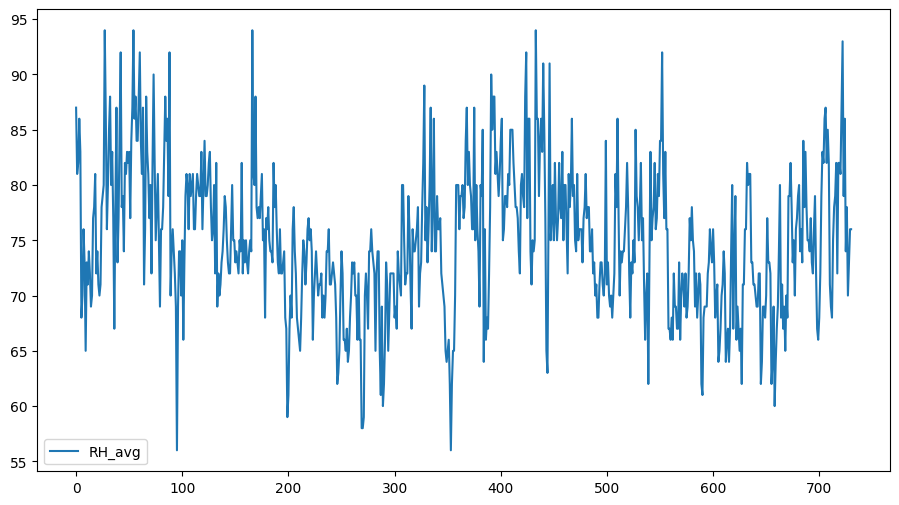

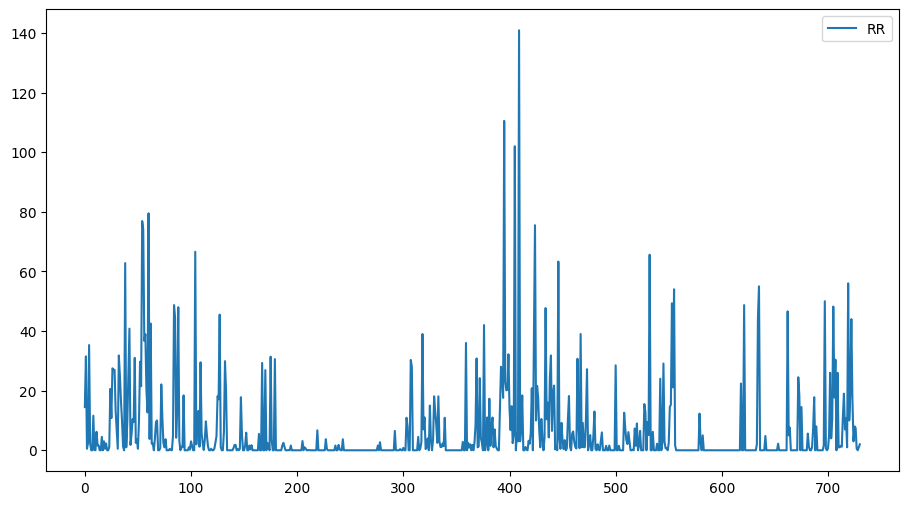

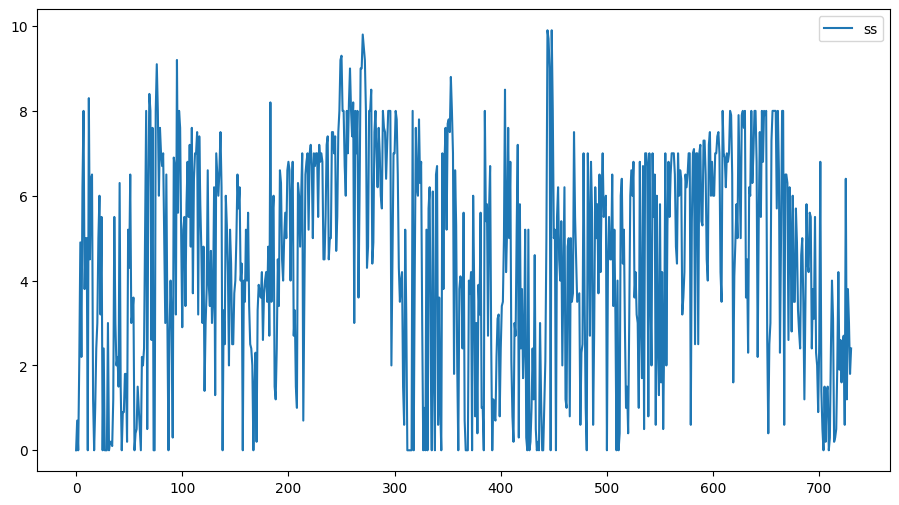

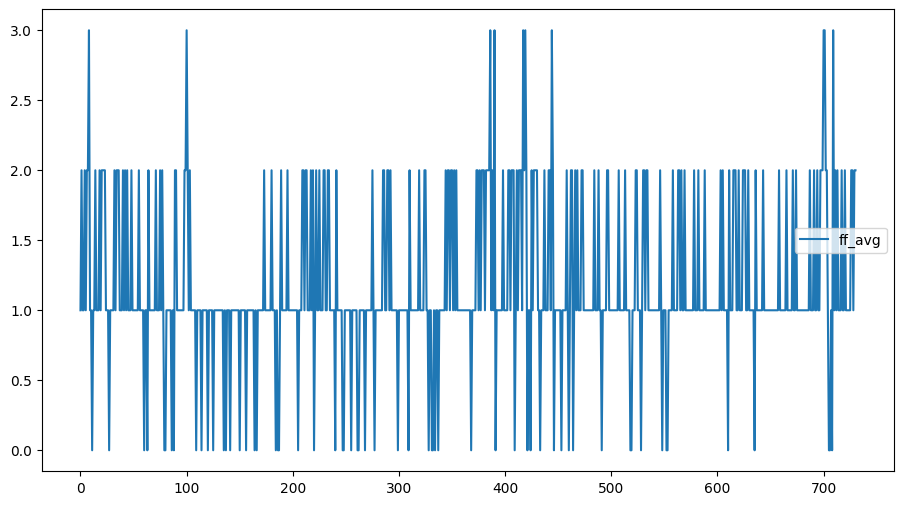

In [409]:
imputed_cuaca_kemayoran.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

imputed_cuaca_kemayoran.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

imputed_cuaca_kemayoran.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

imputed_cuaca_kemayoran.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

imputed_cuaca_kemayoran.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

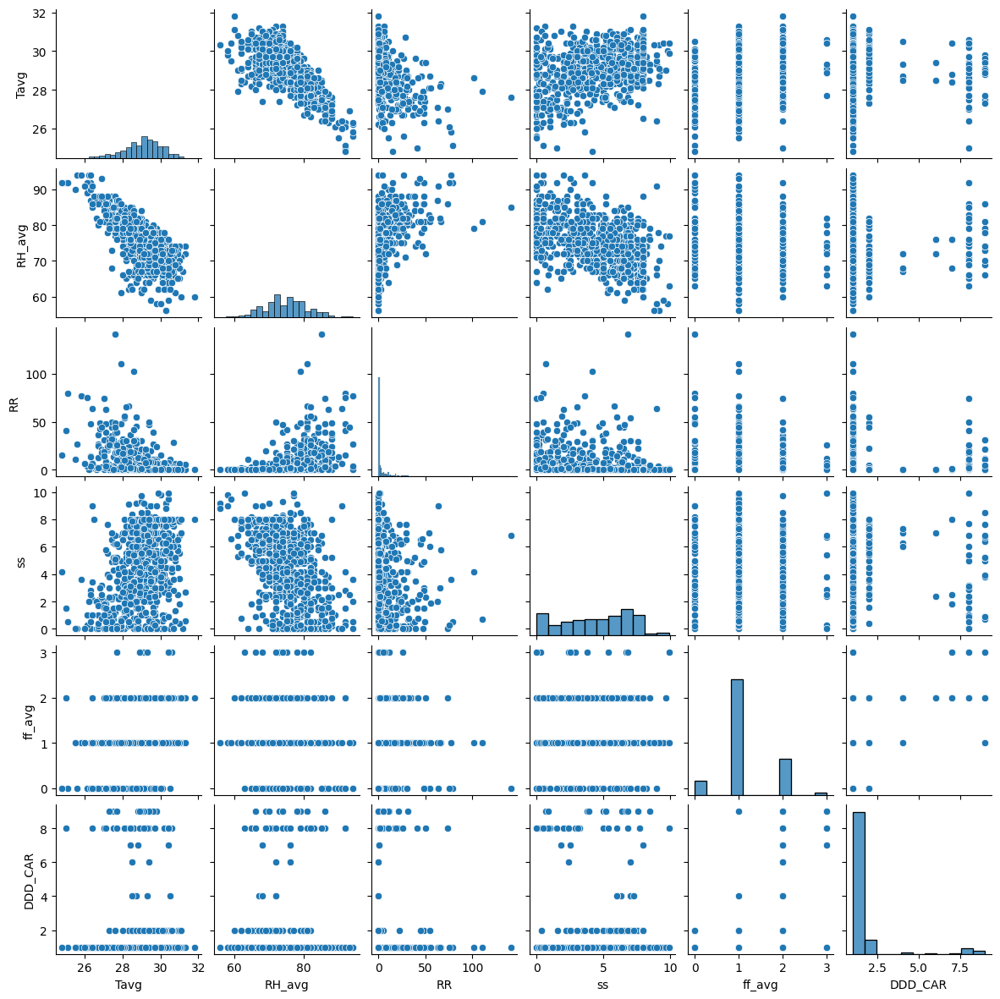

In [410]:
sns.pairplot(imputed_cuaca_kemayoran, height=2)

Rainfall menjadi kolom dengan jumlah imputasi paling banyak (300) data, namun tetap tidak terlihat perubahan yang berarti

### Tanjung Priok

In [411]:
cuaca_tanjung_priok = cuaca_tanjung_priok.drop(columns=['lat', 'long', 'elevation'])

In [412]:
cuaca_tanjung_priok

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,01-01-2021,"26,9",85.0,"7,7",0,2.0,W
1,02-01-2021,"27,3",82.0,"0,5","2,9",3.0,NW
2,03-01-2021,28,82.0,NaN,"5,5",3.0,W
3,04-01-2021,"28,6",79.0,"2,8","2,5",3.0,W
4,05-01-2021,"27,8",84.0,NaN,7,2.0,W
...,...,...,...,...,...,...,...
1456,27-12-2024,"29,2",81.0,-,"4,6",3.0,W
1457,28-12-2024,"29,6",79.0,-,"7,3",2.0,NW
1458,29-12-2024,"29,3",81.0,-,"5,9",3.0,W
1459,30-12-2024,"28,2",79.0,1,"3,7",4.0,W


In [413]:
for i in range(len(cuaca_tanjung_priok['Tanggal'])):
  cuaca_tanjung_priok.loc[i, 'Tanggal'] = datetime.strptime(cuaca_tanjung_priok['Tanggal'][i], '%d-%m-%Y').date()

In [414]:
cuaca_tanjung_priok = cuaca_tanjung_priok[cuaca_tanjung_priok['Tanggal'] >= date(2023, 1, 1)]
cuaca_tanjung_priok = cuaca_tanjung_priok.reset_index(drop=True)
cuaca_tanjung_priok

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,"25,9",93.0,38,"1,3",2.0,C
1,2023-01-02,"27,2",88.0,"134,4","0,1",3.0,W
2,2023-01-03,"26,7",83.0,"0,7","1,1",2.0,W
3,2023-01-04,27,88.0,"3,2","0,1",2.0,W
4,2023-01-05,"27,5",84.0,"31,3","3,5",3.0,W
...,...,...,...,...,...,...,...
726,2024-12-27,"29,2",81.0,-,"4,6",3.0,W
727,2024-12-28,"29,6",79.0,-,"7,3",2.0,NW
728,2024-12-29,"29,3",81.0,-,"5,9",3.0,W
729,2024-12-30,"28,2",79.0,1,"3,7",4.0,W


In [415]:
cuaca_tanjung_priok[['Tavg', 'RR', 'ss']] = cuaca_tanjung_priok[['Tavg', 'RR', 'ss']].apply(lambda x: x.str.replace(',','.'))

In [416]:
cuaca_tanjung_priok[['RR', 'ss']] = cuaca_tanjung_priok[['RR', 'ss']].replace('-', np.nan)
cuaca_tanjung_priok[['Tavg', 'RR', 'ss']] = cuaca_tanjung_priok[['Tavg', 'RR', 'ss']].astype(float)

In [417]:
cuaca_tanjung_priok['DDD_CAR'].unique()

array(['C ', 'W ', 'NW', 'N ', 'E ', 'NE', 'SE', nan, 'S ', 'SW', 'C',
       'E', 'N', 'S', 'W'], dtype=object)

In [418]:
cuaca_tanjung_priok['DDD_CAR'] = cuaca_tanjung_priok['DDD_CAR'].str.strip()
cuaca_tanjung_priok['DDD_CAR'].unique()

array(['C', 'W', 'NW', 'N', 'E', 'NE', 'SE', nan, 'S', 'SW'], dtype=object)

In [419]:
cuaca_tanjung_priok['DDD_CAR'] = cuaca_tanjung_priok['DDD_CAR'].replace({
  'C': 1,
  'N': 2,
  'NE': 3,
  'E': 4,
  'SE': 5,
  'S': 6,
  'SW': 7,
  'W': 8,
  'NW': 9
}).astype(float)

In [420]:
cuaca_tanjung_priok_processed = cuaca_tanjung_priok.copy()

In [421]:
cuaca_tanjung_priok_processed

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
1,2023-01-02,27.2,88.0,134.4,0.1,3.0,8.0
2,2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
3,2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
4,2023-01-05,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...
726,2024-12-27,29.2,81.0,NaN,4.6,3.0,8.0
727,2024-12-28,29.6,79.0,NaN,7.3,2.0,9.0
728,2024-12-29,29.3,81.0,NaN,5.9,3.0,8.0
729,2024-12-30,28.2,79.0,1.0,3.7,4.0,8.0


#### Missing Values

In [422]:
pysqldf(""" select 
        count(*) 
        from cuaca_tanjung_priok
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
""")

,count(*)
0,156


In [423]:
pysqldf(""" select 
        *
        from cuaca_tanjung_priok
        where Tavg is null and
        RH_avg is null and
        RR is null and
        ss is null and
        ff_avg is null
""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-23,None,None,None,None,None,None


In [424]:
cuaca_tanjung_priok_processed = cuaca_tanjung_priok_processed.replace([9999.0, 8888.0], np.nan)

- total row: 731
- rows contain null: 156
- 21.18% data null

#### EDA Univariate

In [425]:
cuaca_tanjung_priok_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Tanggal  731 non-null    object 
 1   Tavg     725 non-null    float64
 2   RH_avg   728 non-null    float64
 3   RR       587 non-null    float64
 4   ss       719 non-null    float64
 5   ff_avg   729 non-null    float64
 6   DDD_CAR  730 non-null    float64
dtypes: float64(6), object(1)
memory usage: 40.1+ KB


In [426]:
cuaca_tanjung_priok_processed = cuaca_tanjung_priok_processed.set_index('Tanggal')

In [427]:
cuaca_tanjung_priok_processed.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,725.000000,728.000000,587.000000,719.000000,729.000000,730.000000
mean,29.192000,78.515110,6.101022,6.010848,2.124829,3.243836
std,1.078682,5.333684,16.997119,2.786096,0.903017,2.768775
min,24.800000,61.000000,0.000000,0.000000,0.000000,1.000000
25%,28.600000,75.000000,0.000000,4.250000,2.000000,1.000000
50%,29.300000,78.000000,0.000000,7.000000,2.000000,2.000000
75%,29.900000,82.000000,2.500000,8.000000,3.000000,5.000000
max,31.300000,96.000000,144.000000,10.100000,6.000000,9.000000


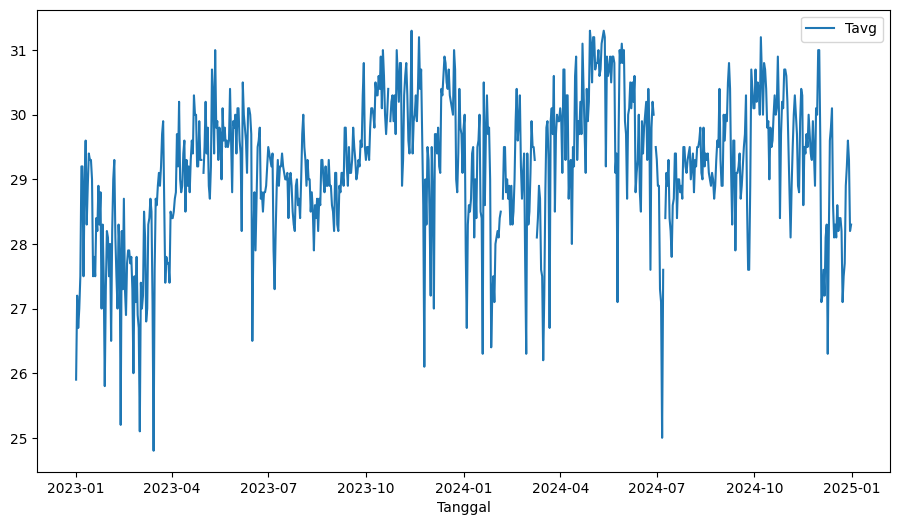

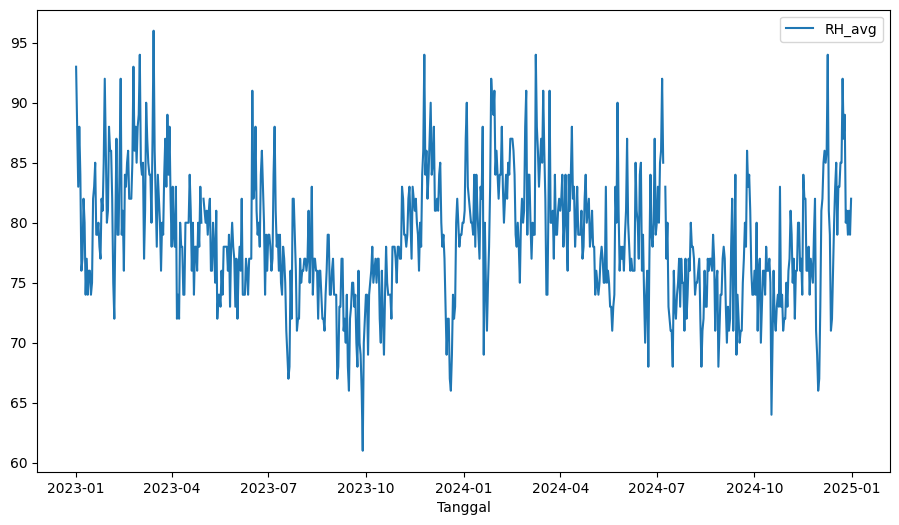

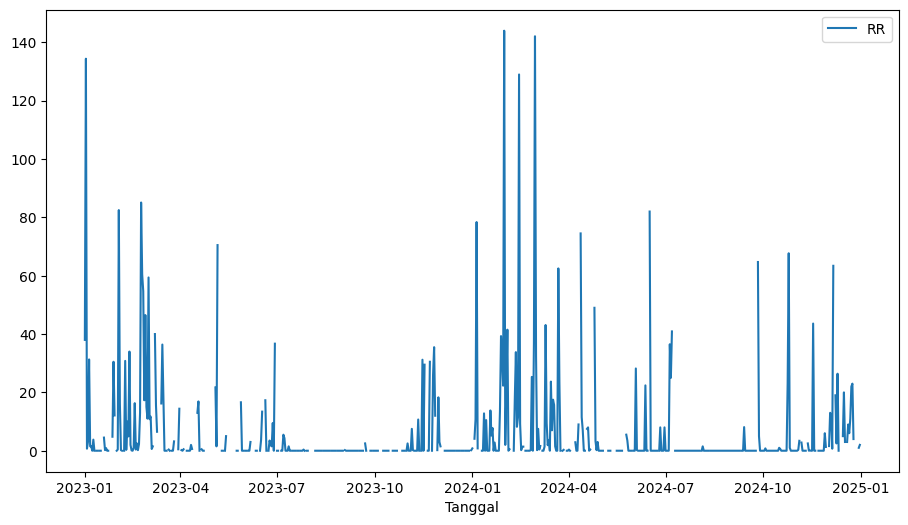

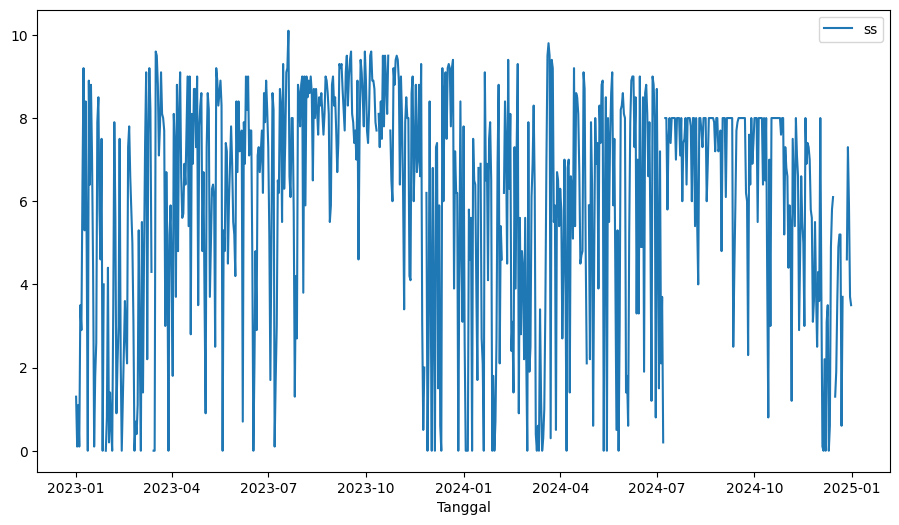

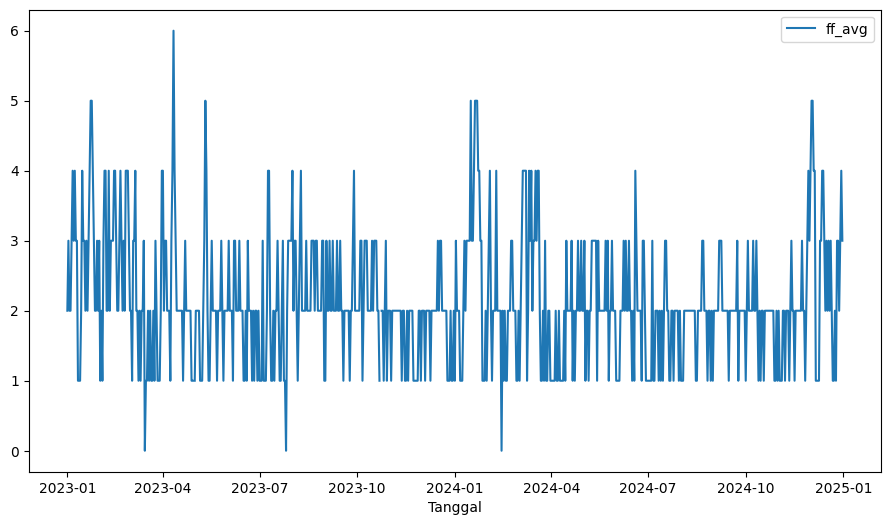

In [428]:
cuaca_tanjung_priok_processed.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

cuaca_tanjung_priok_processed.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

cuaca_tanjung_priok_processed.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

cuaca_tanjung_priok_processed.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

cuaca_tanjung_priok_processed.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

TRENDS
- Tavg has uptrend
- RH_avg in Tanjung Priok is more sideway (no trend)

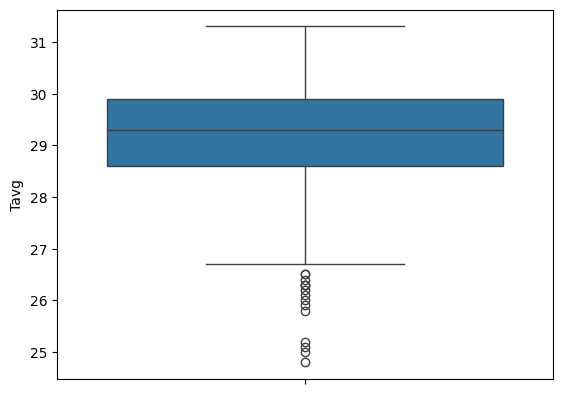

In [429]:
sns.boxplot(y=cuaca_tanjung_priok_processed['Tavg'])
plt.show()

Text(0, 0.5, 'counts')

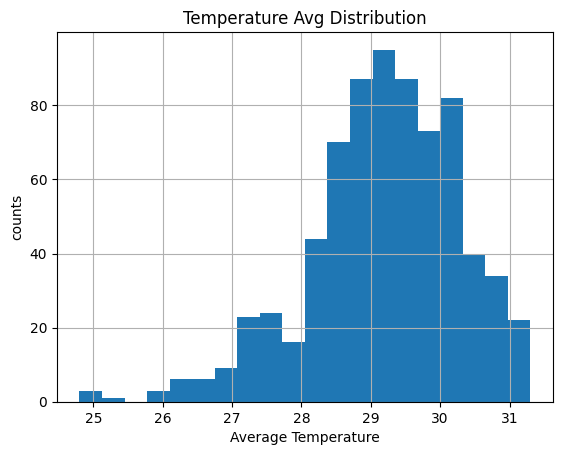

In [430]:
cuaca_tanjung_priok_processed['Tavg'].hist(bins = 20)
plt.title('Temperature Avg Distribution')
plt.xlabel('Average Temperature')
plt.ylabel('counts')

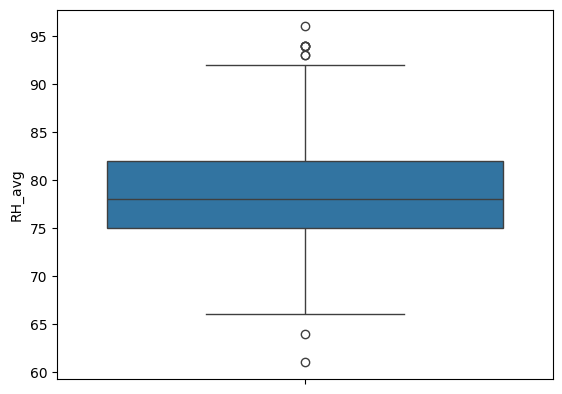

In [431]:
sns.boxplot(y=cuaca_tanjung_priok_processed['RH_avg'])
plt.show()

Text(0, 0.5, 'count')

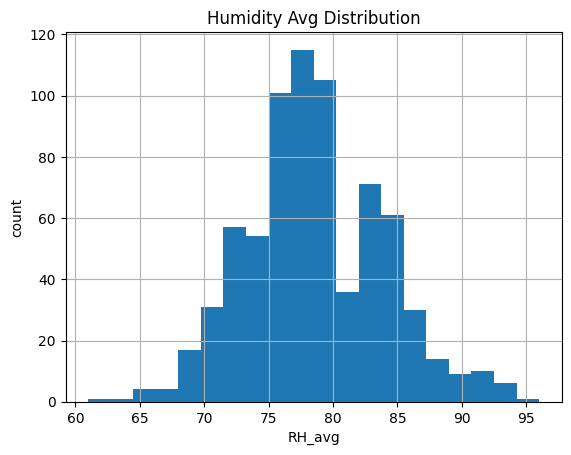

In [432]:
cuaca_tanjung_priok_processed['RH_avg'].hist(bins = 20)
plt.title('Humidity Avg Distribution')
plt.xlabel('RH_avg')
plt.ylabel('count')

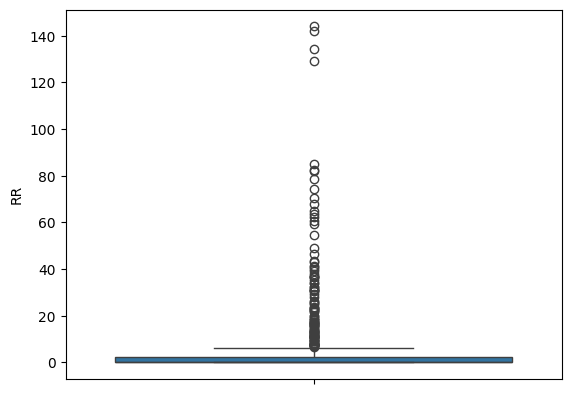

In [433]:
sns.boxplot(y=cuaca_tanjung_priok_processed['RR'])
plt.show()

Text(0, 0.5, 'count')

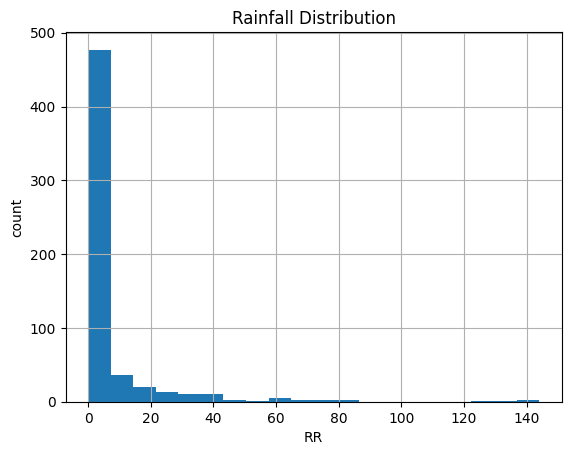

In [434]:
cuaca_tanjung_priok_processed['RR'].hist(bins = 20)
plt.title('Rainfall Distribution')
plt.xlabel('RR')
plt.ylabel('count')

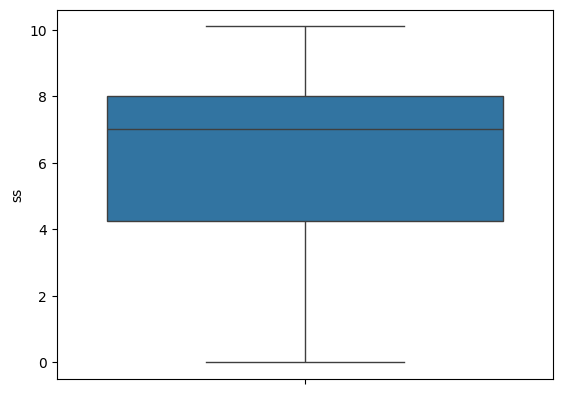

In [435]:
sns.boxplot(y=cuaca_tanjung_priok_processed['ss'])
plt.show()

Text(0, 0.5, 'count')

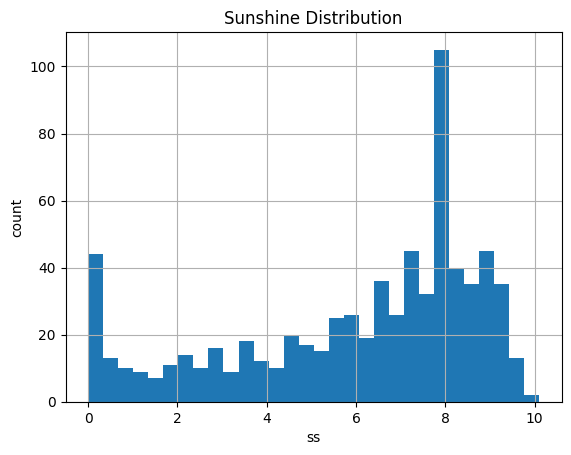

In [436]:
cuaca_tanjung_priok_processed['ss'].hist(bins = 30)
plt.title('Sunshine Distribution')
plt.xlabel('ss')
plt.ylabel('count')

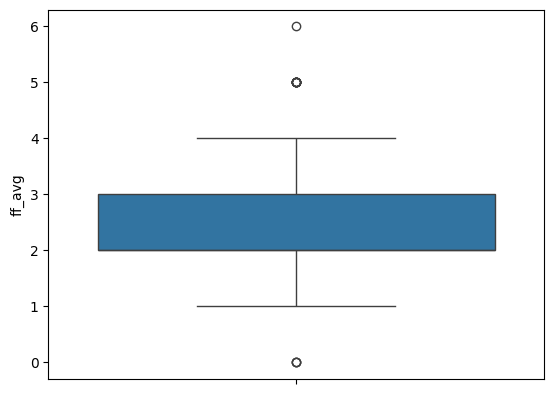

In [437]:
sns.boxplot(y=cuaca_tanjung_priok_processed['ff_avg'])
plt.show()

Text(0, 0.5, 'count')

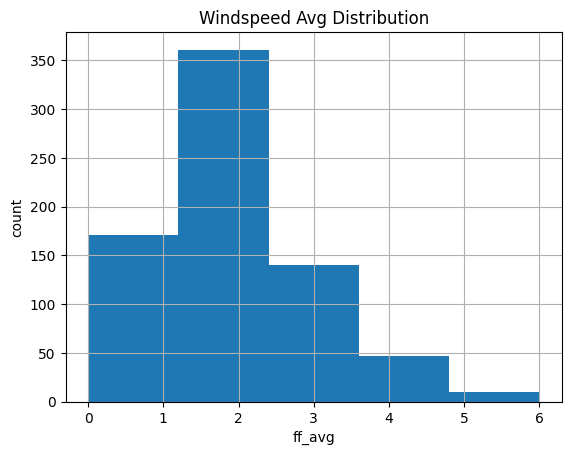

In [438]:
cuaca_tanjung_priok_processed['ff_avg'].hist(bins = 5)
plt.title('Windspeed Avg Distribution')
plt.xlabel('ff_avg')
plt.ylabel('count')

DISTRIBUTIONS
- Tavg menyerupai normal distribution namun lebih right skew dari Kemayoran
- RH_avg hampir menyerupai normal distribution
- sunshine lebih memiliki bentuk namun tetap tidak menyerupai normal distribution

#### EDA Bivariate

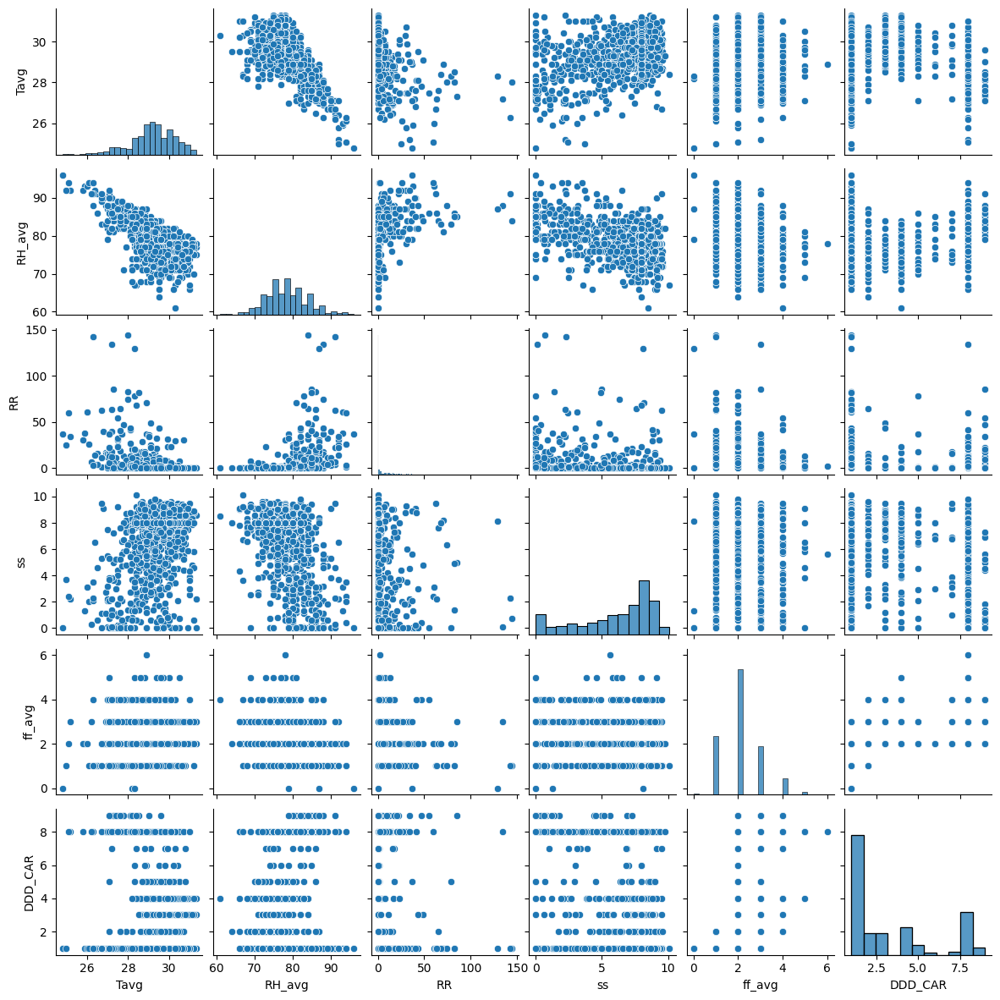

In [439]:
sns.pairplot(cuaca_tanjung_priok_processed, height=2)

Temperature wise
- LOWER Temperature - HIGHER Humidity
- no trend in Temperature & Rainfall
- no trend in Temperature & Sunshine

Humidity wise
- HIGHER Humidity - cenderung HIGHER Rainfall
- ada sedikir kecenderungan LOWER RH_avg membuat HIGHER Sunshine

Else is hard to see the correlation

#### Impute Data

In [440]:
cuaca_tanjung_priok_processed.index[0]

datetime.date(2023, 1, 1)

In [441]:
cuaca_tanjung_priok_processed

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
Tanggal,,,,,,
2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...
2024-12-27,29.2,81.0,NaN,4.6,3.0,8.0
2024-12-28,29.6,79.0,NaN,7.3,2.0,9.0
2024-12-29,29.3,81.0,NaN,5.9,3.0,8.0


In [442]:
# KNN
imputer = KNNImputer()
imputed_cuaca_tanjung_priok = pd.concat(
  [
    pd.DataFrame({
      'Tanggal': cuaca_tanjung_priok['Tanggal']
    }),
    pd.DataFrame(imputer.fit_transform(cuaca_tanjung_priok_processed),columns = ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR'])
  ], axis=1
)

In [443]:
imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].round(1)
imputed_cuaca_tanjung_priok[['RH_avg', 'DDD_CAR']] = imputed_cuaca_tanjung_priok[['RH_avg', 'DDD_CAR']].round(0)

In [444]:
imputed_cuaca_tanjung_priok

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
1,2023-01-02,27.2,88.0,134.4,0.1,3.0,8.0
2,2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
3,2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
4,2023-01-05,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...
726,2024-12-27,29.2,81.0,11.1,4.6,3.0,8.0
727,2024-12-28,29.6,79.0,0.0,7.3,2.0,9.0
728,2024-12-29,29.3,81.0,7.7,5.9,3.0,8.0
729,2024-12-30,28.2,79.0,1.0,3.7,4.0,8.0


In [445]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_tanjung_priok where Tanggal in ('2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-21,30.0,75.0,0.0,8.1,2.0,3.0
1,2023-10-22,30.4,74.0,0.0,9.5,1.0,1.0
2,2023-10-23,29.2,78.0,6.1,6.0,2.1,3.0
3,2023-10-24,29.9,74.0,0.0,7.7,2.0,4.0
4,2023-10-25,30.2,72.0,0.0,6.5,2.0,5.0


In [446]:
# Linear Interpolation
imputed_cuaca_tanjung_priok.loc[imputed_cuaca_tanjung_priok['Tanggal'] == datetime.strptime('23-10-2023', '%d-%m-%Y').date(), ['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = np.nan
imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']] = imputed_cuaca_tanjung_priok[['Tavg', 'RH_avg', 'RR', 'ss', 'ff_avg', 'DDD_CAR']].interpolate(method ='linear', limit_direction ='forward')

In [447]:
# Interpolation in 23 October 2023
pysqldf("""select * from imputed_cuaca_tanjung_priok where Tanggal in ('2023-10-20', '2023-10-21', '2023-10-22', '2023-10-23', '2023-10-24', '2023-10-25', '2023-10-26')""")

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-10-20,29.70,78.0,0.0,8.9,2.0,1.0
1,2023-10-21,30.00,75.0,0.0,8.1,2.0,3.0
2,2023-10-22,30.40,74.0,0.0,9.5,1.0,1.0
3,2023-10-23,30.15,74.0,0.0,8.6,1.5,2.5
4,2023-10-24,29.90,74.0,0.0,7.7,2.0,4.0
5,2023-10-25,30.20,72.0,0.0,6.5,2.0,5.0
6,2023-10-26,30.30,78.0,0.0,6.0,1.0,1.0


In [448]:
imputed_cuaca_tanjung_priok.loc[imputed_cuaca_tanjung_priok['ff_avg'] <= 2]

,Tanggal,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
0,2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
2,2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
3,2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
10,2023-01-11,28.3,77.0,0.1,4.8,1.0,1.0
11,2023-01-12,28.9,74.0,0.0,0.0,1.0,1.0
...,...,...,...,...,...,...,...
721,2024-12-22,28.2,85.0,11.0,0.6,1.0,1.0
722,2024-12-23,27.1,92.0,22.0,3.7,1.0,1.0
723,2024-12-24,27.5,87.0,23.0,3.7,2.0,8.0
724,2024-12-25,27.7,89.0,4.0,0.6,1.0,1.0


#### EDA After Cleaning

In [449]:
imputed_cuaca_tanjung_priok.describe()

,Tavg,RH_avg,RR,ss,ff_avg,DDD_CAR
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,29.185157,78.514364,5.770041,5.994118,2.123256,3.242818
std,1.080830,5.326928,15.608431,2.774775,0.902284,2.767015
min,24.800000,61.000000,0.000000,0.000000,0.000000,1.000000
25%,28.600000,75.000000,0.000000,4.200000,2.000000,1.000000
50%,29.300000,78.000000,0.000000,6.900000,2.000000,2.000000
75%,29.900000,82.000000,3.400000,8.000000,3.000000,5.000000
max,31.300000,96.000000,144.000000,10.100000,6.000000,9.000000


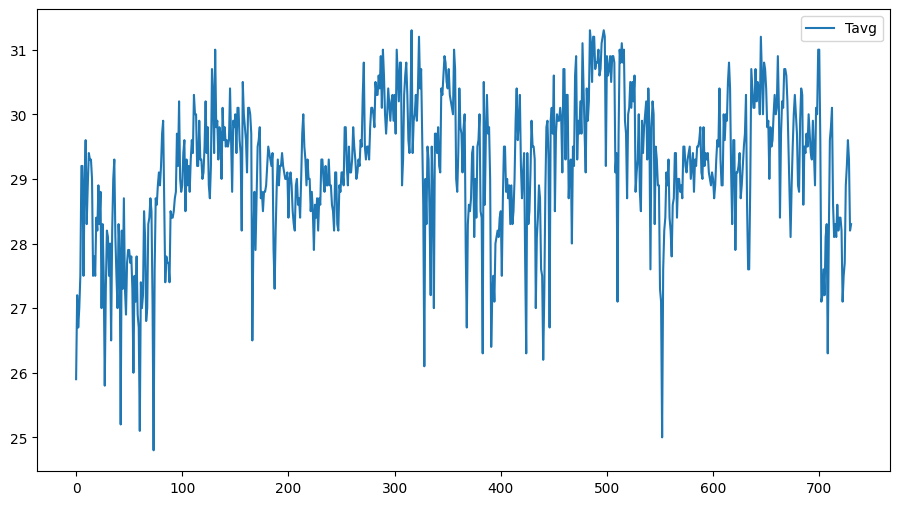

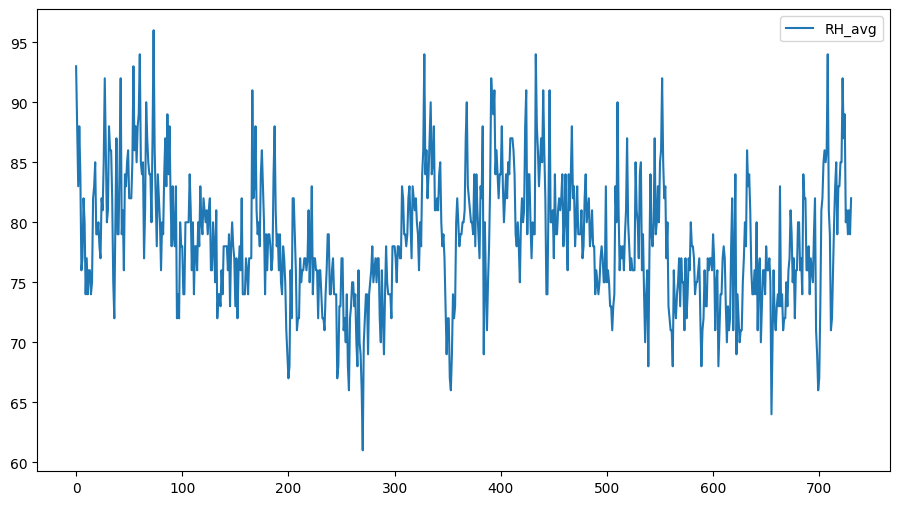

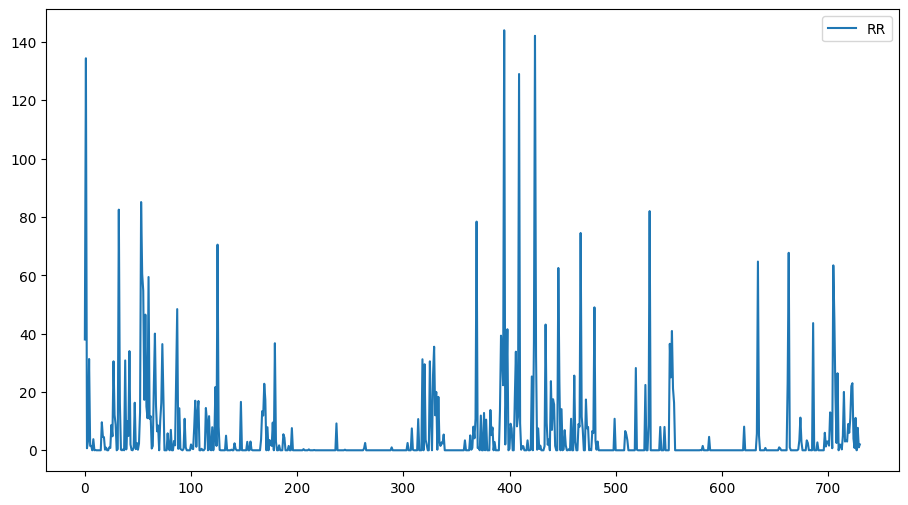

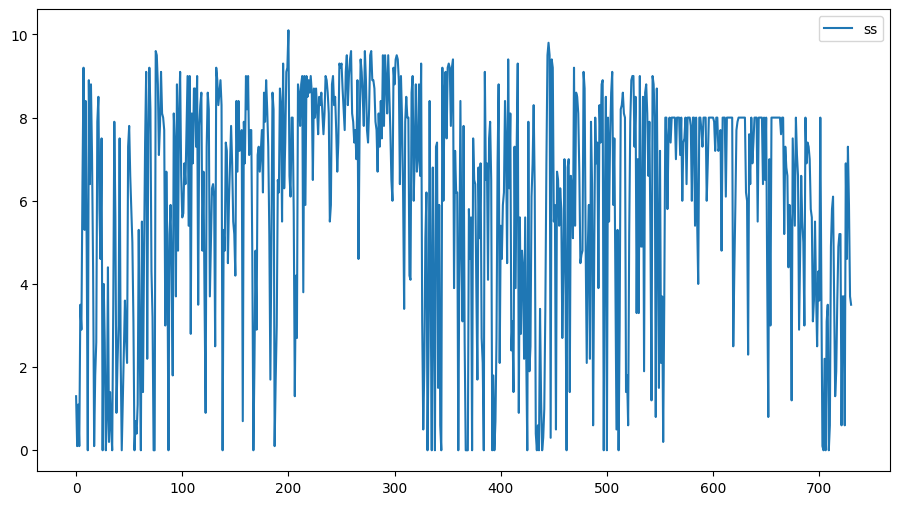

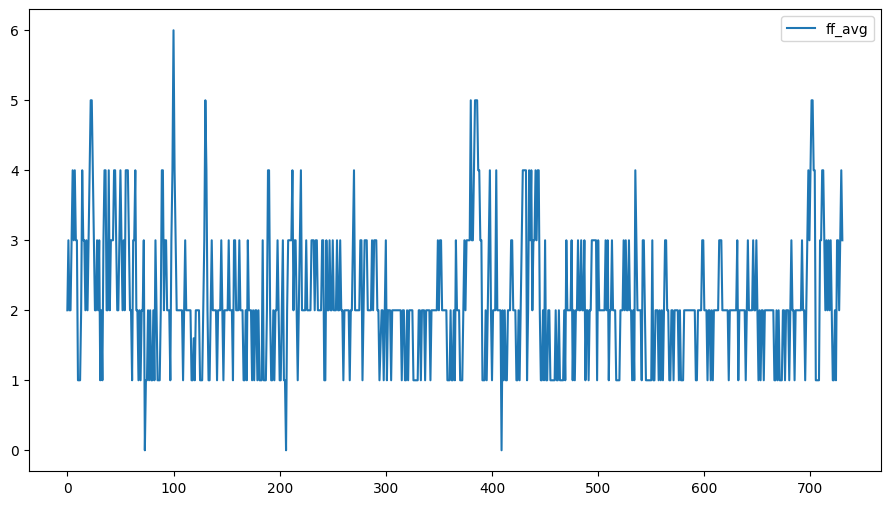

In [450]:
imputed_cuaca_tanjung_priok.plot(y='Tavg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

imputed_cuaca_tanjung_priok.plot(y='RH_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

imputed_cuaca_tanjung_priok.plot(y='RR', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

imputed_cuaca_tanjung_priok.plot(y='ss', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

imputed_cuaca_tanjung_priok.plot(y='ff_avg', figsize=(11,6))
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

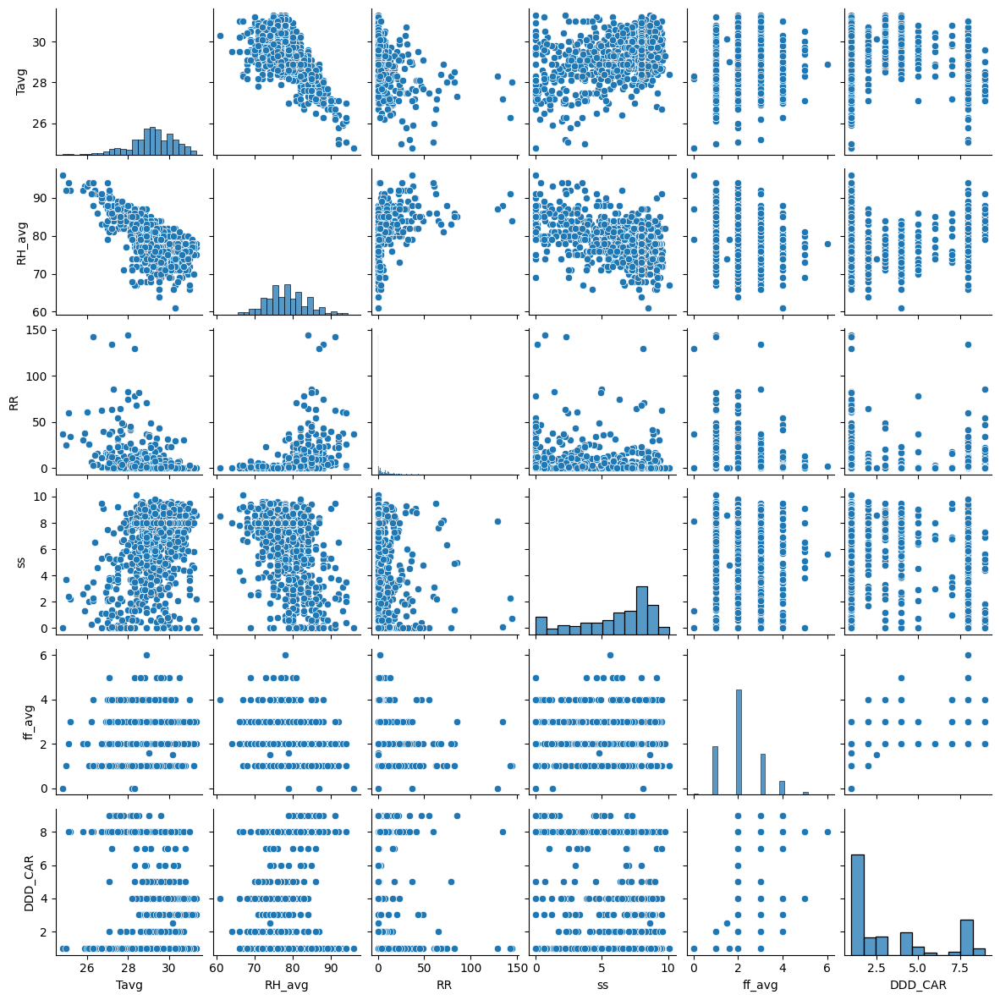

In [451]:
sns.pairplot(imputed_cuaca_tanjung_priok, height=2)

perubahan paling signifikan hanya dialami Rainfall, karena jumlah nullnya paling banyak (see .describe()). namun tetap tidak ada perubahan tren yang bermakna

### Summary EDA Data Cuaca

In [452]:
pysqldf(""" select 
        'Tanjung Priok' as Stasiun,
        count(*) as "Rows contain null"
        from cuaca_tanjung_priok 
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
        UNION
        select 
        'Kemayoran' as Stasiun,
        count(*) 
        from cuaca_kemayoran
        where Tavg is null or Tavg = '9999' or Tavg = '8888'
        or RH_avg is null or RH_avg = '9999' or RH_avg = '8888'
        or RR is null or RR = '9999' or RR = '8888'
        or ss is null or ss = '9999' or ss = '8888'
        or ff_avg is null or ff_avg = '9999' or ff_avg = '8888'
""")

,Stasiun,Rows contain null
0,Kemayoran,200
1,Tanjung Priok,156


**TRENDS**

*Kemayoran*:
- Tavg
    - memiliki trend menaik dari awal ke akhir 2023, lalu 2024 tidak ada tren
    - secara keseluruhan terdapat musiman sekitar 5-6 bulan sekali dari 2023-2024
- RH_avg
    - tidak ada trend
    - terdapat musiman yang terjadi sekitar 1 tahun sekali. RH akan tinggi pada awal dan akhir tahun, lalu menurun pada pertengahan tahun
- RR
    - tidak ada trend
    - seasonality: curah hujan yang menaik saat menjelang akhir tahun dan baru menurun saat menjelang pertengahan tahun

    -> ini mengikuti pola musim hujan dan kemarau tahunan indonesia
- SS
    - tidak ada tren
    - sulit untuk melihat seasonality, namun cenderung intensitas matahari lebih tinggi di bulan 10
- ff_avg
    - tidak ada tren
    - rata-rata ff_avg 1-2 m/s

*Tanjung Priok*:
- Tavg semakin naik
- RH_avg no trend

**DISTRIBUTIONS**

*Kemayoran*:
- Tavg: mempunyai bentuk distribusi normal yang right skew
- RH_avg mempunyai bentuk distribusi normal yang hampir sempurna
- RR: sangat left skew, artinya curah hujan lebih sering rendah
- ss: tidak dapat ditentukan
- ff_avg: dominan dengan kecepatan 1

*Tanjung Priok*:
- Tavg menyerupai normal distribution namun lebih right skew dari Kemayoran
- RH_avg hampir menyerupai normal distribution
- sunshine lebih memiliki bentuk namun tetap tidak menyerupai normal distribution

**CORRELATIONS**

*Kemayoran*
1. Temperature
    - HIGHER Humidity - LOWER Temperature
    - HIGHER Rainfall - cenderung LOWER Temperature
    - HIGHER Sunshine - cendurung HIGHER Temperature
2. Humidity
    - HIGHER Rainfall - cenderung HIGHER Humidity
    - LOWER sunshine - cenderung HIGHER Humidity

*Tanjung Priok*
1. Temperature
    - LOWER Temperature - HIGHER Humidity
    - no trend in Temperature & Rainfall
    - no trend in Temperature & Sunshine
2. Humidity
    - HIGHER Humidity - cenderung HIGHER Rainfall
    - ada sedikir kecenderungan LOWER RH_avg membuat HIGHER Sunshine


**Missing Value Summary (Kemayoran & Tanjung Priok)**

**Kemayoran**
- total row: 1440
- rows contain null: 434
- 30.14% data null

List of Missing Values:
  - Tavg: 8888, blank
  - RH_avg: blank
  - RR: 8888, blank
  - ss: blank
  - ff_avg: blank
  - ddd_car: blank

**Tanjung Priok**
- total row: 1440
- rows contain null: 305
- 21.18% data null

List of Missing Values:
- Tavg: blank
- RH_avg: blank
- RR: 8888, blank
- ss: blank
- ff_avg: blank
- ddd_car: blank 

After Cleaning & Preprocessing

Tanjung Priok: Rainfall menjadi kolom dengan jumlah imputasi paling banyak (300) data, namun tetap tidak terlihat perubahan yang berarti

### Menggabung Stasiun Kemayoran & Tanjung Priok

In [453]:
imputed_cuaca_kemayoran = imputed_cuaca_kemayoran.rename(columns={
  'Tavg': 'Tavg_km',
  'RH_avg': 'RH_avg_km',
  'RR': 'RR_km',
  'ss': 'ss_km',
  'ff_avg': 'ff_avg_km',
  'DDD_CAR': 'DDD_CAR_km'
})

imputed_cuaca_kemayoran = imputed_cuaca_kemayoran.set_index('Tanggal')
imputed_cuaca_kemayoran

,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km
Tanggal,,,,,,
2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0
2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0
2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0
2023-01-04,26.4,86.0,2.4,2.1,1.0,1.0
2023-01-05,27.4,83.0,35.3,4.9,2.0,1.0
...,...,...,...,...,...,...
2024-12-27,29.2,78.0,7.5,1.2,2.0,1.0
2024-12-28,30.0,70.0,0.6,3.8,2.0,1.0
2024-12-29,29.7,73.0,0.0,3.0,1.0,1.0


In [454]:
imputed_cuaca_tanjung_priok = imputed_cuaca_tanjung_priok.rename(columns={
  'Tavg': 'Tavg_tp',
  'RH_avg': 'RH_avg_tp',
  'RR': 'RR_tp',
  'ss': 'ss_tp',
  'ff_avg': 'ff_avg_tp',
  'DDD_CAR': 'DDD_CAR_tp'
})
imputed_cuaca_tanjung_priok = imputed_cuaca_tanjung_priok.set_index('Tanggal')
imputed_cuaca_tanjung_priok

,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
Tanggal,,,,,,
2023-01-01,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...
2024-12-27,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,29.3,81.0,7.7,5.9,3.0,8.0


In [455]:
data_meteorologi = imputed_cuaca_kemayoran.join(imputed_cuaca_tanjung_priok)
data_meteorologi

,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
Tanggal,,,,,,,,,,,,
2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0


## Data Polutan

### Penyamaan Kolom

#### Polutan 1 (tahun 2021)

In [456]:
# polutan_1 = polutan_1.rename(columns={'categori': 'kategori'})

#### Polutan 2 (tahun 2022)

In [457]:
# polutan_2 = polutan_2.rename(columns={
#   'pm_duakomalima': 'pm25',
#   'categori': 'kategori'
# })

#### Polutan 3 (tahun 2023)

In [458]:
polutan_3 = polutan_3.rename(columns={
  'pm_sepuluh': 'pm10',
  'pm_duakomalima': 'pm25',
  'sulfur_dioksida': 'so2',
  'karbon_monoksida': 'co',
  'ozon': 'o3',
  'nitrogen_dioksida': 'no2'
})

In [459]:
polutan_3

,periode_data,tanggal,stasiun,pm10,pm25,so2,co,o3,no2,max,critical,kategori
0,202301,01/01/2023,DKI1,44,55,47,10,24,9,55,PM25,SEDANG
1,202301,01/01/2023,DKI2,44,61,56,16,20,19,61,PM25,SEDANG
2,202301,01/01/2023,DKI3,26,43,51,5,16,2,51,SO2,SEDANG
3,202301,01/01/2023,DKI4,23,57,-,-,-,-,57,PM25,SEDANG
4,202301,01/01/2023,DKI5,30,-,21,13,14,1,52,PM10,SEDANG
...,...,...,...,...,...,...,...,...,...,...,...,...
1820,202312,31/12/2023,DKI1,54,68,49,11,19,12,68,PM25,SEDANG
1821,202312,31/12/2023,DKI2,47,58,56,21,23,24,58,PM25,SEDANG
1822,202312,31/12/2023,DKI3,48,49,-,24,14,-,49,PM25,BAIK
1823,202312,31/12/2023,DKI4,49,73,-,-,-,-,73,PM25,SEDANG


#### Polutan 4 (tahun 2024)

In [460]:
polutan_4 = polutan_4.rename(columns={
  'pm_sepuluh': 'pm10',
  'pm_duakomalima': 'pm25',
  'sulfur_dioksida': 'so2',
  'karbon_monoksida': 'co',
  'ozon': 'o3',
  'nitrogen_dioksida': 'no2'
})

In [461]:
polutan_4['tanggal_2'] = polutan_4['tanggal'].astype('str') + '/' + polutan_4['bulan'].astype('str') + '/' + '2024'

In [462]:
polutan_4.insert(1, 'tanggal_3', polutan_4['tanggal_2'])

In [463]:
polutan_4.pop('bulan')
polutan_4.pop('tanggal')
polutan_4.pop('tanggal_2')

0        21/1/2024
1        22/1/2024
2        23/1/2024
3        24/1/2024
4        25/1/2024
           ...    
1520    10/10/2024
1521    11/10/2024
1522    12/10/2024
1523    13/10/2024
1524    14/10/2024
Name: tanggal_2, Length: 1525, dtype: object

In [464]:
polutan_4 = polutan_4.rename(columns=({'tanggal_3': 'tanggal'}))

In [465]:
polutan_4

,periode_data,tanggal,stasiun,pm10,pm25,so2,co,o3,no2,max,critical,kategori
0,202401,21/1/2024,DKI3,51.0,65.0,45.0,9.0,8.0,79.0,79.0,NaN,SEDANG
1,202401,22/1/2024,DKI3,27.0,34.0,45.0,5.0,8.0,56.0,56.0,NaN,SEDANG
2,202401,23/1/2024,DKI3,NaN,52.0,46.0,6.0,9.0,51.0,52.0,PM25,SEDANG
3,202401,24/1/2024,DKI3,46.0,65.0,46.0,8.0,9.0,38.0,65.0,PM25,SEDANG
4,202401,25/1/2024,DKI3,37.0,55.0,47.0,7.0,11.0,28.0,55.0,PM25,SEDANG
...,...,...,...,...,...,...,...,...,...,...,...,...
1520,202410,10/10/2024,DKI4,58.0,62.0,53.0,20.0,41.0,20.0,62.0,PM25,SEDANG
1521,202410,11/10/2024,DKI4,64.0,66.0,53.0,23.0,34.0,26.0,66.0,PM25,SEDANG
1522,202410,12/10/2024,DKI4,58.0,64.0,54.0,21.0,33.0,25.0,64.0,PM25,SEDANG
1523,202410,13/10/2024,DKI4,59.0,60.0,53.0,21.0,36.0,20.0,60.0,PM25,SEDANG


### Penggabungan Data 2023-2024

In [466]:
merge_polutan = pd.concat([polutan_3, polutan_4], ignore_index=True,axis=0)

In [467]:
merge_polutan.pop('periode_data')
merge_polutan.pop('max')
merge_polutan.pop('critical')
merge_polutan.pop('kategori')

0       SEDANG
1       SEDANG
2       SEDANG
3       SEDANG
4       SEDANG
         ...  
3345    SEDANG
3346    SEDANG
3347    SEDANG
3348    SEDANG
3349    SEDANG
Name: kategori, Length: 3350, dtype: object

In [468]:
merge_polutan

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,01/01/2023,DKI1,44,55,47,10,24,9
1,01/01/2023,DKI2,44,61,56,16,20,19
2,01/01/2023,DKI3,26,43,51,5,16,2
3,01/01/2023,DKI4,23,57,-,-,-,-
4,01/01/2023,DKI5,30,-,21,13,14,1
...,...,...,...,...,...,...,...,...
3345,10/10/2024,DKI4,58.0,62.0,53.0,20.0,41.0,20.0
3346,11/10/2024,DKI4,64.0,66.0,53.0,23.0,34.0,26.0
3347,12/10/2024,DKI4,58.0,64.0,54.0,21.0,33.0,25.0
3348,13/10/2024,DKI4,59.0,60.0,53.0,21.0,36.0,20.0


### Data Understanding

- Check data after merged
- find the Non-NaN empty values
- formatting data

In [469]:
merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3350 entries, 0 to 3349
Data columns (total 8 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   tanggal  3350 non-null   object
 1   stasiun  3350 non-null   object
 2   pm10     3321 non-null   object
 3   pm25     3339 non-null   object
 4   so2      3343 non-null   object
 5   co       3339 non-null   object
 6   o3       3343 non-null   object
 7   no2      3331 non-null   object
dtypes: object(8)
memory usage: 209.5+ KB


In [470]:
merge_polutan.describe()

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
count,3350,3350,3321,3339,3343,3339,3343,3331
unique,670,5,169,248,115,91,152,133
top,14/10/2024,DKI1,-,-,53,10,21,16
freq,5,670,222,295,113,147,81,90


In [471]:
merge_polutan['tanggal'] = pd.to_datetime(merge_polutan['tanggal'], format = '%d/%m/%Y')

In [472]:
merge_polutan = merge_polutan.sort_values(by='tanggal', ignore_index=True)

#### PM10

In [473]:
# Checking Non-NaN empty values (unique values)
pm10_uv = pysqldf(""" select distinct pm10 from merge_polutan where pm10 not like '%.0' """)

pm10_uv[~pm10_uv['pm10'].astype(str).str.isnumeric()]

# THERE IS None TOO

,pm10
26,-


#### PM2.5

In [474]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct pm25 from merge_polutan where pm25 like '%.%' order by pm25 """)['pm25'].values
pm25_uv = pysqldf(""" select distinct pm25 from merge_polutan where pm25 not like '%.0' order by pm25""") # not float
pm25_uv[~pm25_uv['pm25'].astype(str).str.isnumeric()]

# THERE IS None TOO

,pm25
0,-


#### SO2

In [475]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct so2 from merge_polutan where so2 like '%.%' order by so2 """)['so2'].values
so2_uv = pysqldf(""" select distinct so2 from merge_polutan where so2 not like '%.0' order by so2""") # not float
so2_uv[~so2_uv['so2'].astype(str).str.isnumeric()]

# THERE IS None TOO

,so2
0,-


#### CO

In [476]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct co from merge_polutan where co like '%.%' order by co """)['co'].values
co_uv = pysqldf(""" select distinct co from merge_polutan where co not like '%.0' order by co""") # not float
co_uv[~co_uv['co'].astype(str).str.isnumeric()]

# THERE IS None TOO

,co
0,-
1,---


#### O3

In [477]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct o3 from merge_polutan where o3 like '%.%' order by o3 """)['o3'].values
o3_uv = pysqldf(""" select distinct o3 from merge_polutan where o3 not like '%.0' order by o3""") # not float
o3_uv[~o3_uv['o3'].astype(str).str.isnumeric()]

# THERE IS None TOO

,o3
0,-
1,---


In [478]:
# Checking Non-NaN empty values (unique values)

# pysqldf(""" select distinct no2 from merge_polutan where no2 like '%.%' order by no2 """)['no2'].values
no2_uv = pysqldf(""" select distinct no2 from merge_polutan where no2 not like '%.0' order by no2""") # not float
no2_uv[~no2_uv['no2'].astype(str).str.isnumeric()]

# THERE IS None TOO

,no2
0,-


### Check Missing Values Pada Penggabungan Data 2021-2024

1. pm10: '-', '---', blank
2. pm25: '-', '---', blank
3. so2: '-', '---', blank
4. co: '-', '---', blank
5. o3: '-', '---', blank
6. no2: '-', '---', blank


Missing Values Pada Penggabungan Data 2023-2024

1. pm10: '-', blank
2. pm25: '-', blank
3. so2: '-', blank
4. co: '-', '---', blank
5. o3: '-', '---', blank
6. no2: '-', blank


missing values akan diubah ke dalamn NaN

In [479]:
merge_polutan = merge_polutan.replace(['-', '---'], np.nan)

In [480]:
for col in ['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']:
  merge_polutan[col] = merge_polutan[col].astype(float)

In [481]:
merge_polutan

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01,DKI1,44.0,55.0,47.0,10.0,24.0,9.0
1,2023-01-01,DKI2,44.0,61.0,56.0,16.0,20.0,19.0
2,2023-01-01,DKI3,26.0,43.0,51.0,5.0,16.0,2.0
3,2023-01-01,DKI4,23.0,57.0,NaN,NaN,NaN,NaN
4,2023-01-01,DKI5,30.0,NaN,21.0,13.0,14.0,1.0
...,...,...,...,...,...,...,...,...
3345,2024-10-31,DKI5,55.0,89.0,41.0,20.0,52.0,15.0
3346,2024-10-31,DKI2,65.0,80.0,59.0,13.0,28.0,26.0
3347,2024-10-31,DKI1,59.0,78.0,11.0,28.0,29.0,45.0
3348,2024-10-31,DKI4,62.0,59.0,53.0,24.0,41.0,27.0


In [482]:
# # data yang mengandung null values
# null_merge_polutan = merge_polutan[merge_polutan.isnull().any(axis=1)]
# null_merge_polutan

In [483]:
# count_null_merge_polutan = pysqldf(
# """
#   select 
#     stasiun, 
#     sum(case when pm10 is null then 1 else 0 end) as pm10,
#     sum(case when pm25 is null then 1 else 0 end) as pm25,
#     sum(case when so2 is null then 1 else 0 end) as so2,
#     sum(case when co is null then 1 else 0 end) as co,
#     sum(case when o3 is null then 1 else 0 end) as o3,
#     sum(case when no2 is null then 1 else 0 end) as no2
#   from null_merge_polutan
#   group by stasiun
# """
# )
# count_null_merge_polutan

In [484]:
# # see null count of every observed pollutant by each region
# count_null_merge_polutan.plot(
#   x='stasiun',
#   kind='bar',
#   stacked=False
# )

**2023-2024, Missing Values Percentage: 17,88%**

3350 total rows

599 rows contain nulls

**dibawah ini adalah 2023-2024**

current total data: 5175

total rows with missing data: 906

17.55% baris data contains missing value

42 baris data Missing Completely At Random (MCAR)

In [485]:
# # data polutan yang semua perhitungan kosong
# null_rows = pysqldf(""" 
#   select *
#   from null_merge_polutan 
#   where 
#   pm10 is null and
#   pm25 is null and
#   so2 is null and
#   co is null and
#   o3 is null and
#   no2 is null
# """)
# null_rows

In [486]:
# # melihat count baris kosong
# null_row_plot = pysqldf(""" 
#   select strftime('%Y', tanggal) as year,
#     SUM(CASE WHEN stasiun = 'DKI1' THEN 1 ELSE 0 END) AS DKI1,
#     SUM(CASE WHEN stasiun = 'DKI2' THEN 1 ELSE 0 END) AS DKI2,
#     SUM(CASE WHEN stasiun = 'DKI3' THEN 1 ELSE 0 END) AS DKI3,
#     SUM(CASE WHEN stasiun = 'DKI4' THEN 1 ELSE 0 END) AS DKI4,
#     SUM(CASE WHEN stasiun = 'DKI5' THEN 1 ELSE 0 END) AS DKI5
#   from null_merge_polutan 
#   where 
#   pm10 is null and
#   pm25 is null and
#   so2 is null and
#   co is null and
#   o3 is null and
#   no2 is null
#   group by strftime('%Y', tanggal)
#   order by stasiun,
# strftime('%Y', tanggal) asc
# """)

# null_row_plot

In [487]:
# # melihat tanggal dari baris yg kosong

# null_row_occurence = pysqldf(""" 
#   select 
#     substring(tanggal, 0, 11) as tanggal,
#     case 
#       when stasiun = 'DKI1' then 1
#       when stasiun = 'DKI2' then 2
#       when stasiun = 'DKI3' then 3
#       when stasiun = 'DKI4' then 4
#       when stasiun = 'DKI5' then 5             
#     end as data
#   from null_merge_polutan 
#   where 
#   pm10 is null and
#   pm25 is null and
#   so2 is null and
#   co is null and
#   o3 is null and
#   no2 is null
#   order by tanggal
# """)

# plt.figure(figsize=(3, 8))
# plt.scatter(null_row_occurence['data'], null_row_occurence['tanggal'])
# plt.hlines(y=null_row_occurence['tanggal'], xmax=5, xmin=1, linestyles='dashed')
# # plt.xticks(rotation=90)

In [488]:
# # see null ROW count of every observed pollutant by each region
# null_row_plot.plot(
#   x='year',
#   kind='bar',
#   stacked=False,
# )

1. baris yg ga punya data samsek bisa 1 hari aja atau lebih
2. paling sering gada datanya samsek dari DKI4
3. anomali di 2023 september 30: tidak ada data pada kelima stasiun

rencana akan pake KNN or RF buat handle missing values

### Seperate Pollutant Data By stasiun

#### DKI1

In [489]:
merge_polutan_dki1 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI1'""")
merge_polutan_dki1

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI1,44.0,55.0,47.0,10.0,24.0,9.0
1,2023-01-02 00:00:00.000000,DKI1,32.0,43.0,52.0,9.0,24.0,8.0
2,2023-01-03 00:00:00.000000,DKI1,31.0,35.0,49.0,9.0,12.0,7.0
3,2023-01-04 00:00:00.000000,DKI1,30.0,47.0,53.0,11.0,15.0,9.0
4,2023-01-05 00:00:00.000000,DKI1,38.0,50.0,50.0,13.0,26.0,11.0
...,...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,DKI1,54.0,78.0,19.0,23.0,34.0,31.0
666,2024-10-28 00:00:00.000000,DKI1,60.0,83.0,10.0,26.0,37.0,36.0
667,2024-10-29 00:00:00.000000,DKI1,59.0,75.0,11.0,28.0,29.0,41.0
668,2024-10-30 00:00:00.000000,DKI1,62.0,86.0,11.0,27.0,36.0,44.0


In [490]:
merge_polutan_dki1 = merge_polutan_dki1.rename(columns={
  'pm10': 'pm10_dki1',
  'pm25': 'pm25_dki1',
  'so2': 'so2_dki1',
  'co': 'co_dki1',
  'o3': 'o3_dki1',
  'no2': 'no2_dki1'
})
merge_polutan_dki1.pop('stasiun')

0      DKI1
1      DKI1
2      DKI1
3      DKI1
4      DKI1
       ... 
665    DKI1
666    DKI1
667    DKI1
668    DKI1
669    DKI1
Name: stasiun, Length: 670, dtype: object

In [491]:
merge_polutan_dki1

,tanggal,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1
0,2023-01-01 00:00:00.000000,44.0,55.0,47.0,10.0,24.0,9.0
1,2023-01-02 00:00:00.000000,32.0,43.0,52.0,9.0,24.0,8.0
2,2023-01-03 00:00:00.000000,31.0,35.0,49.0,9.0,12.0,7.0
3,2023-01-04 00:00:00.000000,30.0,47.0,53.0,11.0,15.0,9.0
4,2023-01-05 00:00:00.000000,38.0,50.0,50.0,13.0,26.0,11.0
...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,54.0,78.0,19.0,23.0,34.0,31.0
666,2024-10-28 00:00:00.000000,60.0,83.0,10.0,26.0,37.0,36.0
667,2024-10-29 00:00:00.000000,59.0,75.0,11.0,28.0,29.0,41.0
668,2024-10-30 00:00:00.000000,62.0,86.0,11.0,27.0,36.0,44.0


#### DKI2

In [492]:
merge_polutan_dki2 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI2'""")
merge_polutan_dki2

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI2,44.0,61.0,56.0,16.0,20.0,19.0
1,2023-01-02 00:00:00.000000,DKI2,34.0,43.0,59.0,15.0,21.0,19.0
2,2023-01-03 00:00:00.000000,DKI2,28.0,34.0,57.0,13.0,21.0,16.0
3,2023-01-04 00:00:00.000000,DKI2,31.0,49.0,60.0,17.0,21.0,26.0
4,2023-01-05 00:00:00.000000,DKI2,37.0,53.0,57.0,26.0,21.0,35.0
...,...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,DKI2,58.0,77.0,61.0,11.0,32.0,19.0
666,2024-10-28 00:00:00.000000,DKI2,64.0,90.0,60.0,13.0,30.0,22.0
667,2024-10-29 00:00:00.000000,DKI2,65.0,86.0,60.0,14.0,31.0,29.0
668,2024-10-30 00:00:00.000000,DKI2,66.0,87.0,59.0,12.0,34.0,22.0


In [493]:
merge_polutan_dki2 = merge_polutan_dki2.rename(columns={
  'tanggal': 'tanggal_dki2',
  'pm10': 'pm10_dki2',
  'pm25': 'pm25_dki2',
  'so2': 'so2_dki2',
  'co': 'co_dki2',
  'o3': 'o3_dki2',
  'no2': 'no2_dki2'
})
merge_polutan_dki2.pop('stasiun')

0      DKI2
1      DKI2
2      DKI2
3      DKI2
4      DKI2
       ... 
665    DKI2
666    DKI2
667    DKI2
668    DKI2
669    DKI2
Name: stasiun, Length: 670, dtype: object

In [494]:
merge_polutan_dki2

,tanggal_dki2,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2
0,2023-01-01 00:00:00.000000,44.0,61.0,56.0,16.0,20.0,19.0
1,2023-01-02 00:00:00.000000,34.0,43.0,59.0,15.0,21.0,19.0
2,2023-01-03 00:00:00.000000,28.0,34.0,57.0,13.0,21.0,16.0
3,2023-01-04 00:00:00.000000,31.0,49.0,60.0,17.0,21.0,26.0
4,2023-01-05 00:00:00.000000,37.0,53.0,57.0,26.0,21.0,35.0
...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,58.0,77.0,61.0,11.0,32.0,19.0
666,2024-10-28 00:00:00.000000,64.0,90.0,60.0,13.0,30.0,22.0
667,2024-10-29 00:00:00.000000,65.0,86.0,60.0,14.0,31.0,29.0
668,2024-10-30 00:00:00.000000,66.0,87.0,59.0,12.0,34.0,22.0


#### DKI3

In [495]:
merge_polutan_dki3 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI3'""")
merge_polutan_dki3

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI3,26.0,43.0,51.0,5.0,16.0,2.0
1,2023-01-02 00:00:00.000000,DKI3,23.0,40.0,51.0,5.0,16.0,3.0
2,2023-01-03 00:00:00.000000,DKI3,25.0,32.0,53.0,4.0,15.0,NaN
3,2023-01-04 00:00:00.000000,DKI3,30.0,44.0,53.0,5.0,15.0,4.0
4,2023-01-05 00:00:00.000000,DKI3,40.0,59.0,53.0,10.0,18.0,7.0
...,...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,DKI3,44.0,72.0,66.0,8.0,29.0,52.0
666,2024-10-28 00:00:00.000000,DKI3,58.0,87.0,64.0,10.0,28.0,52.0
667,2024-10-29 00:00:00.000000,DKI3,45.0,11.0,64.0,10.0,28.0,54.0
668,2024-10-30 00:00:00.000000,DKI3,53.0,11.0,64.0,9.0,34.0,53.0


In [496]:
merge_polutan_dki3 = merge_polutan_dki3.rename(columns={
  'tanggal': 'tanggal_dki3',
  'pm10': 'pm10_dki3',
  'pm25': 'pm25_dki3',
  'so2': 'so2_dki3',
  'co': 'co_dki3',
  'o3': 'o3_dki3',
  'no2': 'no2_dki3'
})
merge_polutan_dki3.pop('stasiun')

0      DKI3
1      DKI3
2      DKI3
3      DKI3
4      DKI3
       ... 
665    DKI3
666    DKI3
667    DKI3
668    DKI3
669    DKI3
Name: stasiun, Length: 670, dtype: object

In [497]:
merge_polutan_dki3

,tanggal_dki3,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3
0,2023-01-01 00:00:00.000000,26.0,43.0,51.0,5.0,16.0,2.0
1,2023-01-02 00:00:00.000000,23.0,40.0,51.0,5.0,16.0,3.0
2,2023-01-03 00:00:00.000000,25.0,32.0,53.0,4.0,15.0,NaN
3,2023-01-04 00:00:00.000000,30.0,44.0,53.0,5.0,15.0,4.0
4,2023-01-05 00:00:00.000000,40.0,59.0,53.0,10.0,18.0,7.0
...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,44.0,72.0,66.0,8.0,29.0,52.0
666,2024-10-28 00:00:00.000000,58.0,87.0,64.0,10.0,28.0,52.0
667,2024-10-29 00:00:00.000000,45.0,11.0,64.0,10.0,28.0,54.0
668,2024-10-30 00:00:00.000000,53.0,11.0,64.0,9.0,34.0,53.0


#### DKI4

In [498]:
merge_polutan_dki4 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI4'""")
merge_polutan_dki4

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI4,23.0,57.0,NaN,NaN,NaN,NaN
1,2023-01-02 00:00:00.000000,DKI4,27.0,53.0,53.0,3.0,12.0,10.0
2,2023-01-03 00:00:00.000000,DKI4,19.0,43.0,53.0,3.0,11.0,9.0
3,2023-01-04 00:00:00.000000,DKI4,17.0,51.0,53.0,4.0,9.0,10.0
4,2023-01-05 00:00:00.000000,DKI4,21.0,59.0,53.0,19.0,14.0,11.0
...,...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,DKI4,52.0,57.0,55.0,18.0,52.0,22.0
666,2024-10-28 00:00:00.000000,DKI4,60.0,66.0,54.0,23.0,44.0,26.0
667,2024-10-29 00:00:00.000000,DKI4,66.0,64.0,54.0,21.0,44.0,24.0
668,2024-10-30 00:00:00.000000,DKI4,64.0,63.0,54.0,21.0,45.0,30.0


In [499]:
merge_polutan_dki4 = merge_polutan_dki4.rename(columns={
  'tanggal': 'tanggal_dki4',
  'pm10': 'pm10_dki4',
  'pm25': 'pm25_dki4',
  'so2': 'so2_dki4',
  'co': 'co_dki4',
  'o3': 'o3_dki4',
  'no2': 'no2_dki4'
})
merge_polutan_dki4.pop('stasiun')

0      DKI4
1      DKI4
2      DKI4
3      DKI4
4      DKI4
       ... 
665    DKI4
666    DKI4
667    DKI4
668    DKI4
669    DKI4
Name: stasiun, Length: 670, dtype: object

In [500]:
merge_polutan_dki4

,tanggal_dki4,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4
0,2023-01-01 00:00:00.000000,23.0,57.0,NaN,NaN,NaN,NaN
1,2023-01-02 00:00:00.000000,27.0,53.0,53.0,3.0,12.0,10.0
2,2023-01-03 00:00:00.000000,19.0,43.0,53.0,3.0,11.0,9.0
3,2023-01-04 00:00:00.000000,17.0,51.0,53.0,4.0,9.0,10.0
4,2023-01-05 00:00:00.000000,21.0,59.0,53.0,19.0,14.0,11.0
...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,52.0,57.0,55.0,18.0,52.0,22.0
666,2024-10-28 00:00:00.000000,60.0,66.0,54.0,23.0,44.0,26.0
667,2024-10-29 00:00:00.000000,66.0,64.0,54.0,21.0,44.0,24.0
668,2024-10-30 00:00:00.000000,64.0,63.0,54.0,21.0,45.0,30.0


#### DKI5

In [501]:
merge_polutan_dki5 = pysqldf("""SELECT * FROM merge_polutan WHERE stasiun = 'DKI5'""")
merge_polutan_dki5

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
0,2023-01-01 00:00:00.000000,DKI5,30.0,NaN,21.0,13.0,14.0,1.0
1,2023-01-02 00:00:00.000000,DKI5,25.0,NaN,30.0,13.0,16.0,2.0
2,2023-01-03 00:00:00.000000,DKI5,22.0,NaN,28.0,11.0,15.0,NaN
3,2023-01-04 00:00:00.000000,DKI5,26.0,NaN,31.0,12.0,17.0,2.0
4,2023-01-05 00:00:00.000000,DKI5,35.0,NaN,26.0,23.0,18.0,NaN
...,...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,DKI5,48.0,75.0,45.0,17.0,42.0,10.0
666,2024-10-28 00:00:00.000000,DKI5,42.0,79.0,40.0,18.0,52.0,10.0
667,2024-10-29 00:00:00.000000,DKI5,51.0,83.0,40.0,19.0,48.0,16.0
668,2024-10-30 00:00:00.000000,DKI5,56.0,99.0,40.0,20.0,58.0,14.0


In [502]:
merge_polutan_dki5 = merge_polutan_dki5.rename(columns={
  'tanggal': 'tanggal_dki5',
  'pm10': 'pm10_dki5',
  'pm25': 'pm25_dki5',
  'so2': 'so2_dki5',
  'co': 'co_dki5',
  'o3': 'o3_dki5',
  'no2': 'no2_dki5'
})
merge_polutan_dki5.pop('stasiun')

0      DKI5
1      DKI5
2      DKI5
3      DKI5
4      DKI5
       ... 
665    DKI5
666    DKI5
667    DKI5
668    DKI5
669    DKI5
Name: stasiun, Length: 670, dtype: object

In [503]:
merge_polutan_dki5

,tanggal_dki5,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
0,2023-01-01 00:00:00.000000,30.0,NaN,21.0,13.0,14.0,1.0
1,2023-01-02 00:00:00.000000,25.0,NaN,30.0,13.0,16.0,2.0
2,2023-01-03 00:00:00.000000,22.0,NaN,28.0,11.0,15.0,NaN
3,2023-01-04 00:00:00.000000,26.0,NaN,31.0,12.0,17.0,2.0
4,2023-01-05 00:00:00.000000,35.0,NaN,26.0,23.0,18.0,NaN
...,...,...,...,...,...,...,...
665,2024-10-27 00:00:00.000000,48.0,75.0,45.0,17.0,42.0,10.0
666,2024-10-28 00:00:00.000000,42.0,79.0,40.0,18.0,52.0,10.0
667,2024-10-29 00:00:00.000000,51.0,83.0,40.0,19.0,48.0,16.0
668,2024-10-30 00:00:00.000000,56.0,99.0,40.0,20.0,58.0,14.0


### Univarite Visualization

#### DKI 1

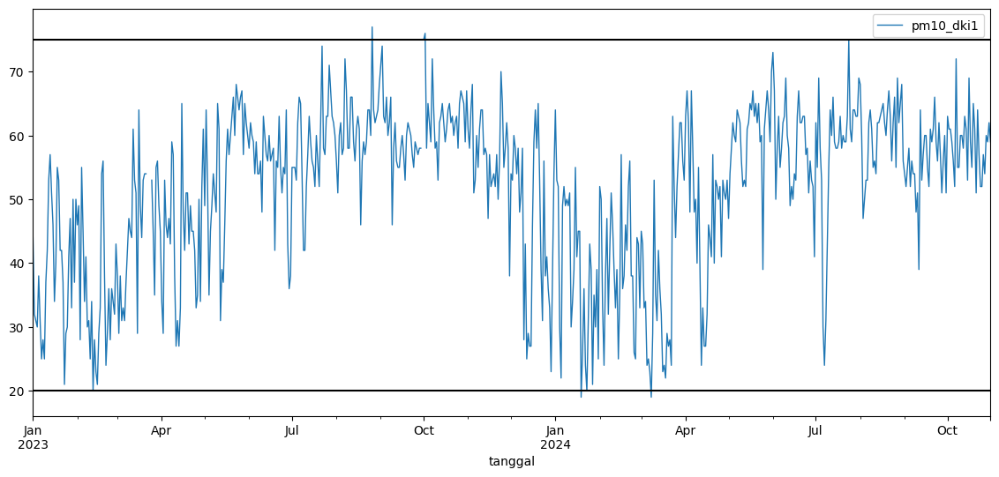

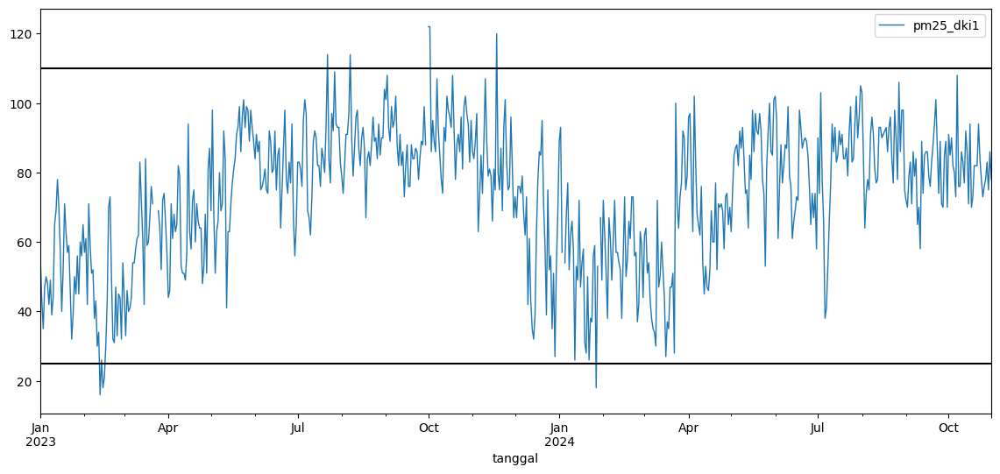

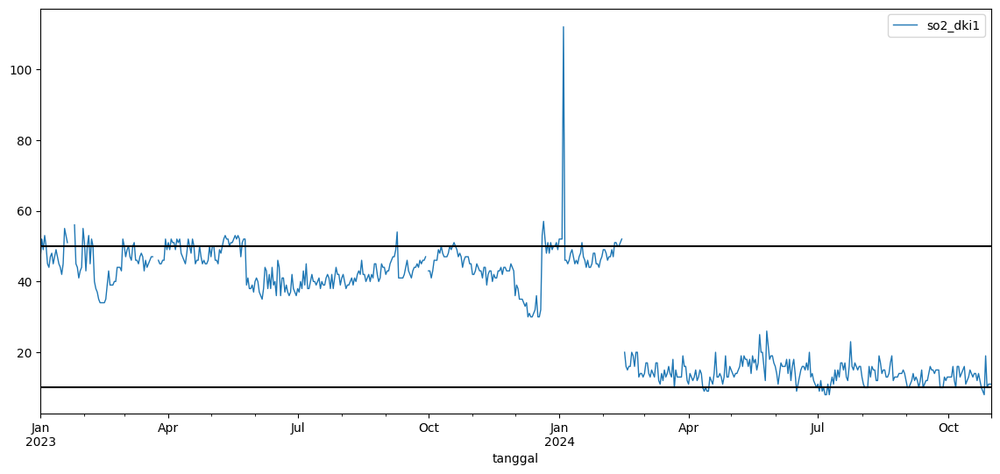

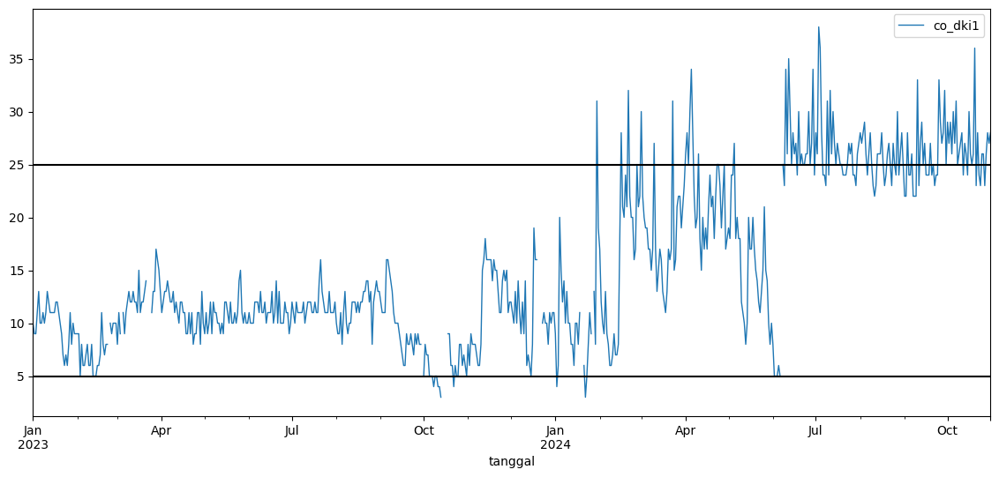

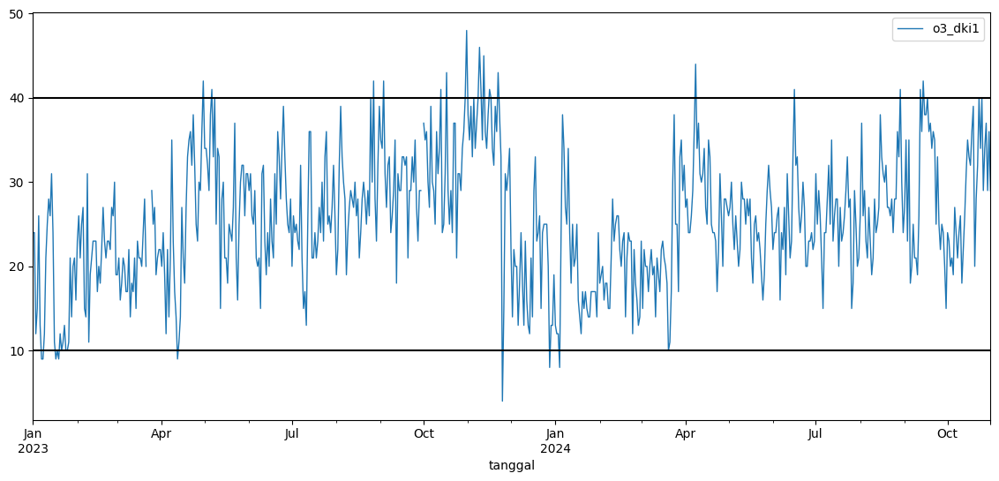

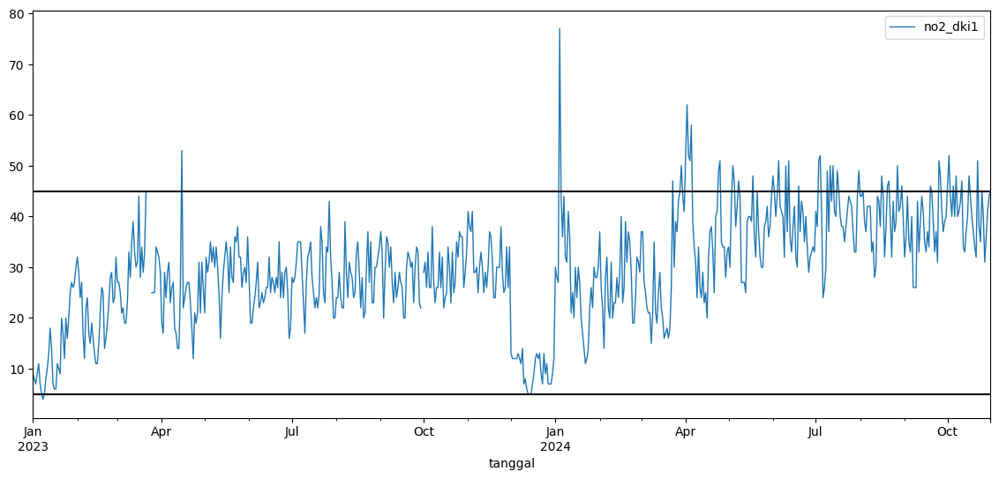

In [504]:
merge_polutan_dki1_temp = merge_polutan_dki1.copy()
merge_polutan_dki1_temp['tanggal'] = pd.to_datetime(merge_polutan_dki1_temp['tanggal'])
merge_polutan_dki1_temp = merge_polutan_dki1_temp.set_index('tanggal')

merge_polutan_dki1_temp.plot(y='pm10_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki1_temp.plot(y='pm25_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki1_temp.plot(y='so2_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki1_temp.plot(y='co_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki1_temp.plot(y='o3_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki1_temp.plot(y='no2_dki1', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 2

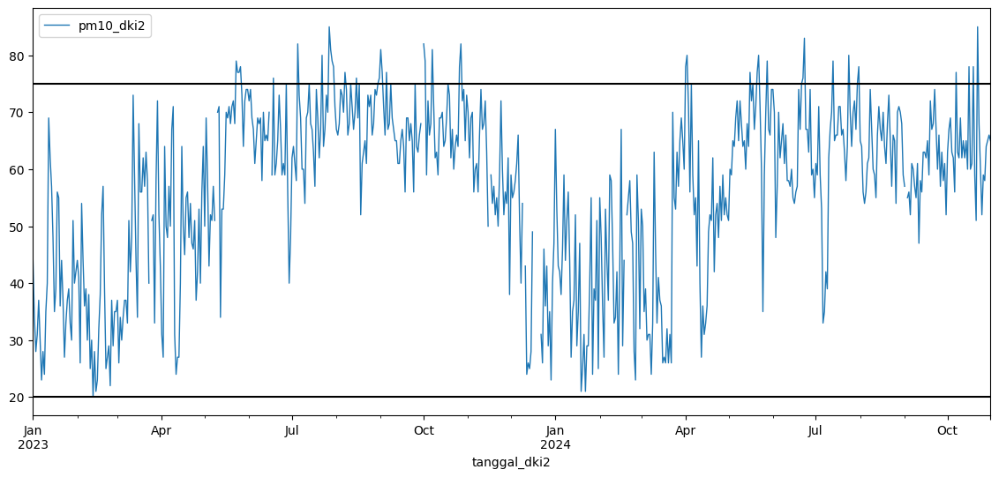

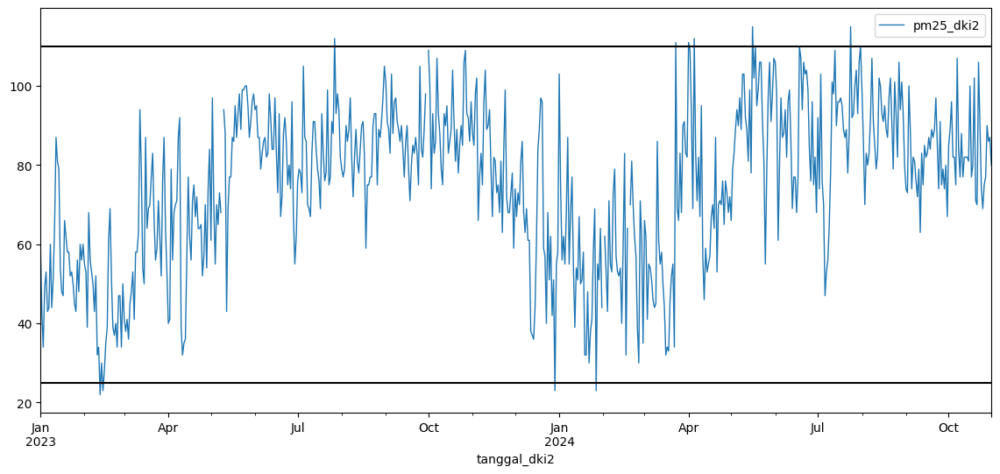

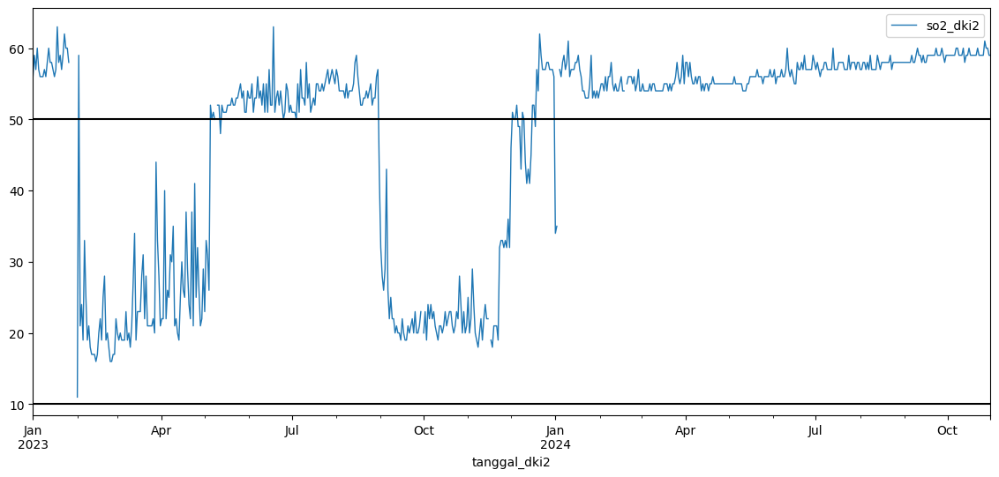

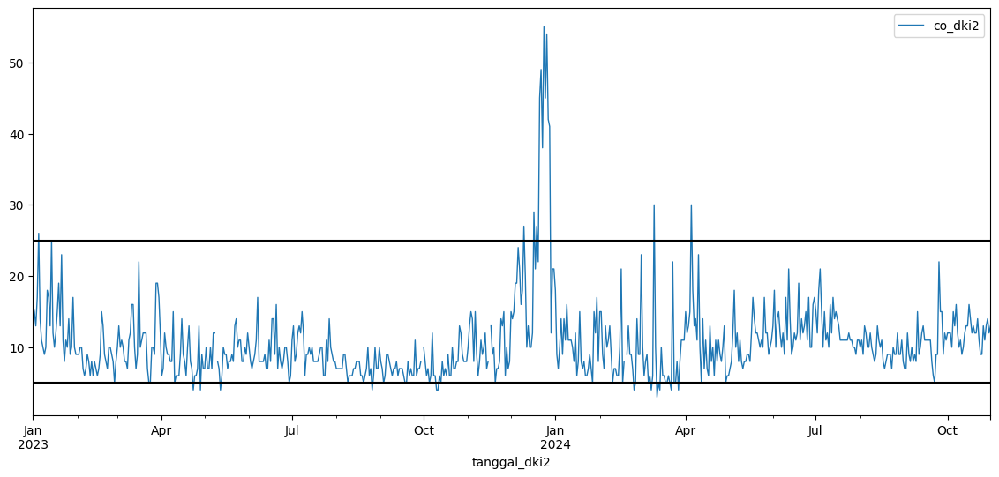

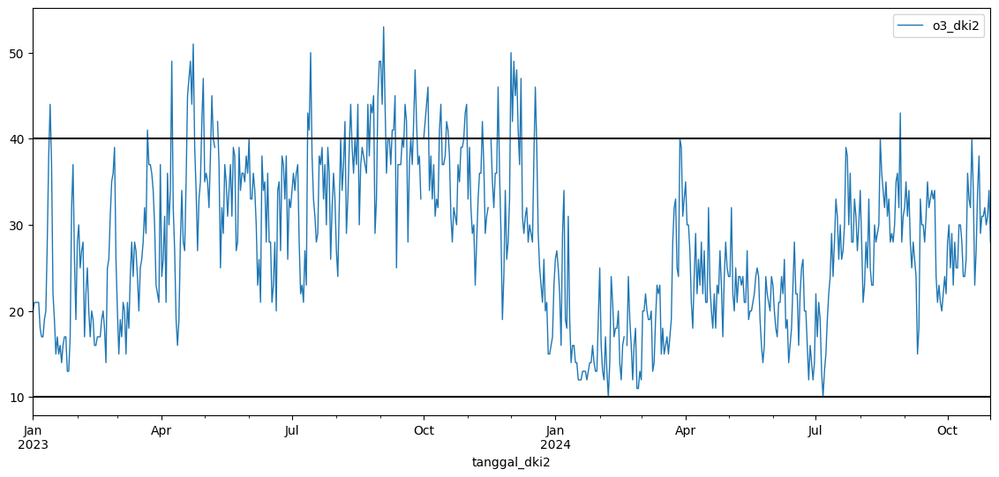

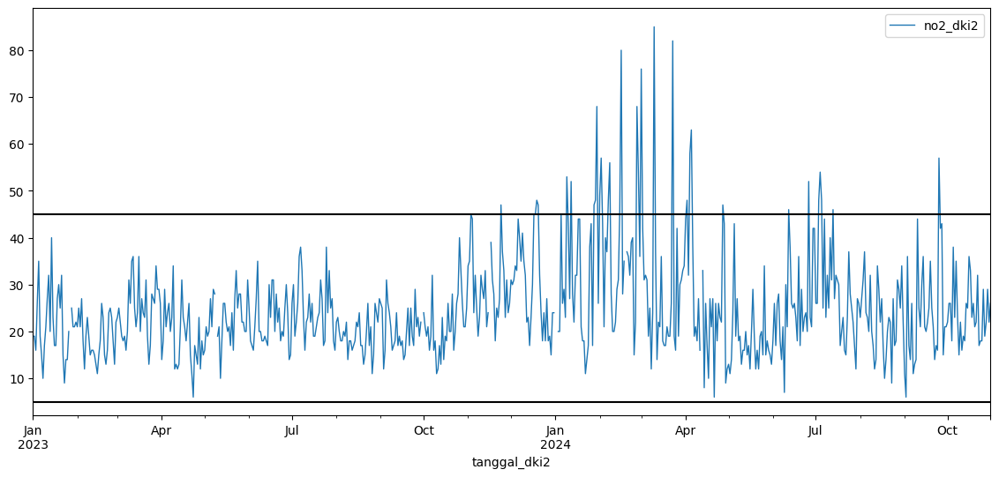

In [505]:
merge_polutan_dki2_temp = merge_polutan_dki2.copy()
merge_polutan_dki2_temp['tanggal_dki2'] = pd.to_datetime(merge_polutan_dki2_temp['tanggal_dki2'])
merge_polutan_dki2_temp = merge_polutan_dki2_temp.set_index('tanggal_dki2')

merge_polutan_dki2_temp.plot(y='pm10_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki2_temp.plot(y='pm25_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki2_temp.plot(y='so2_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki2_temp.plot(y='co_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki2_temp.plot(y='o3_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki2_temp.plot(y='no2_dki2', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 3

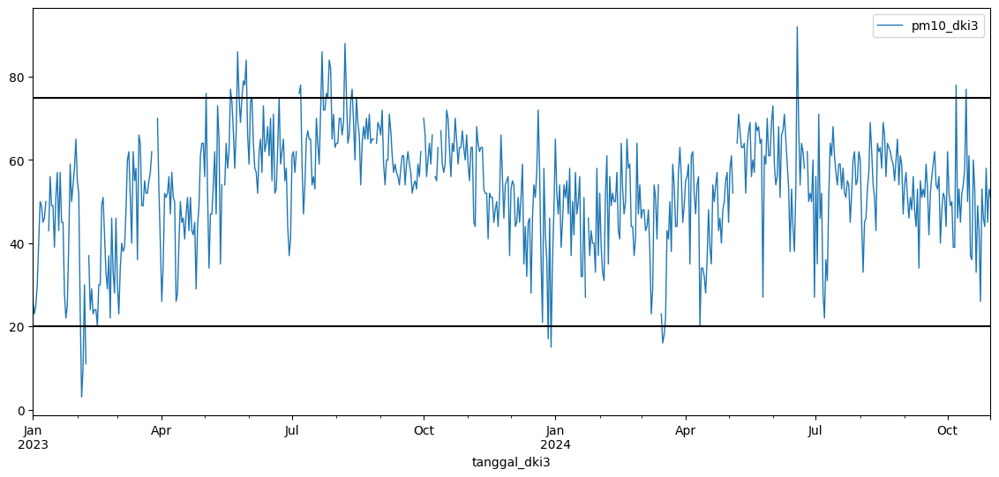

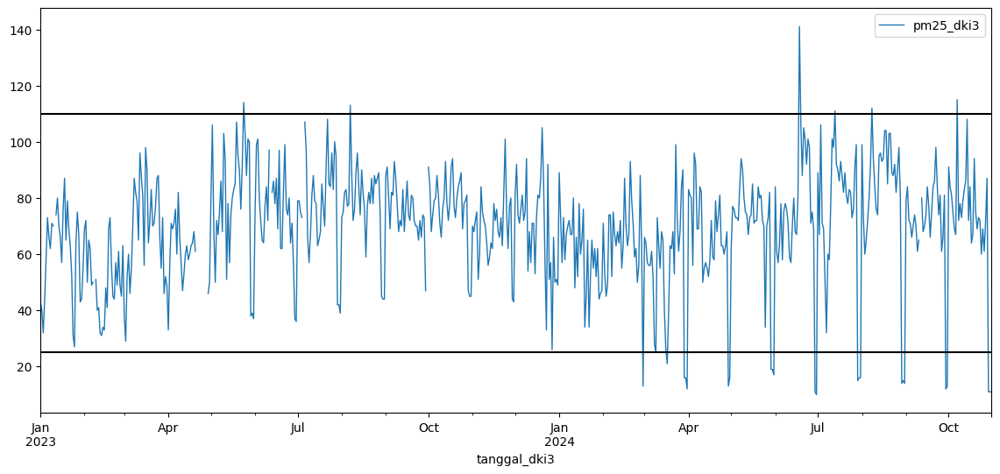

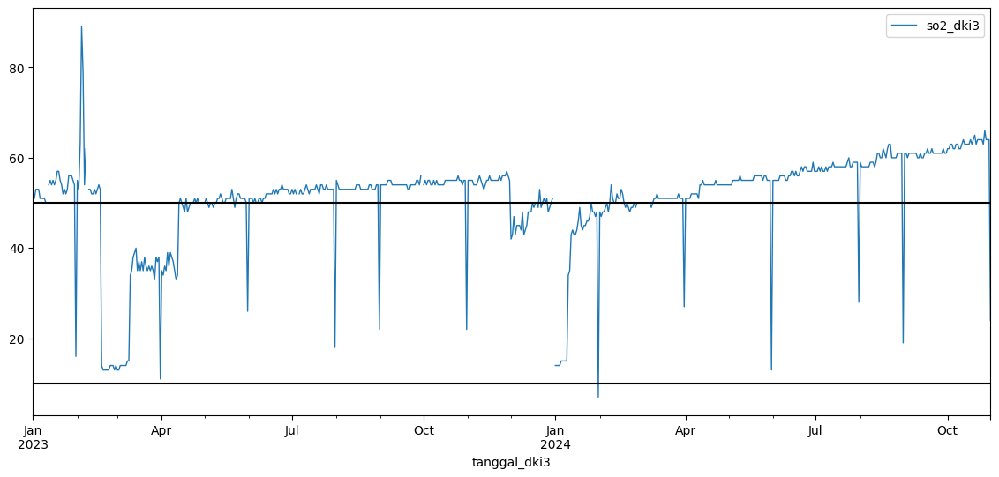

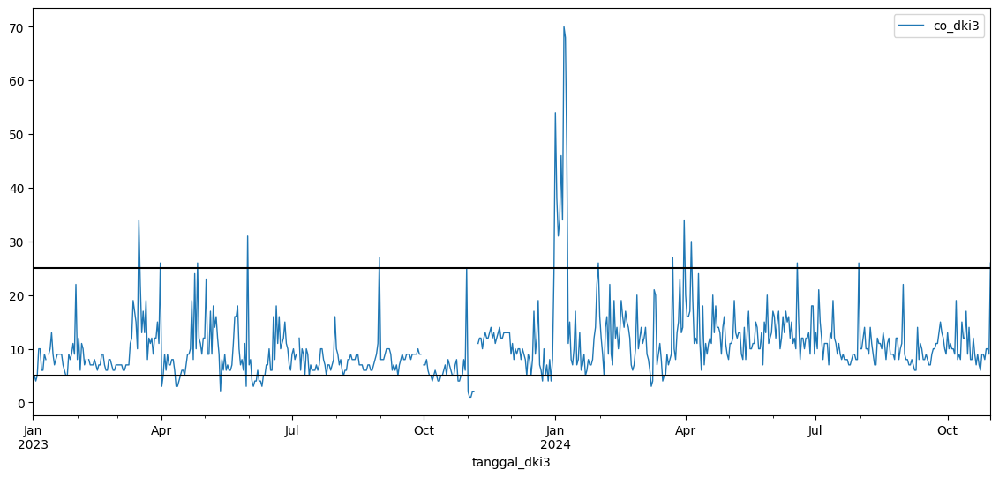

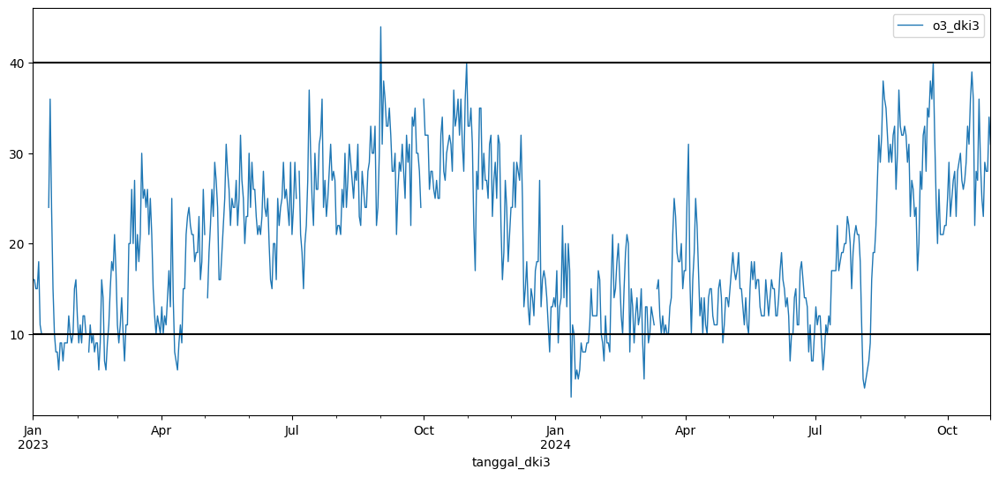

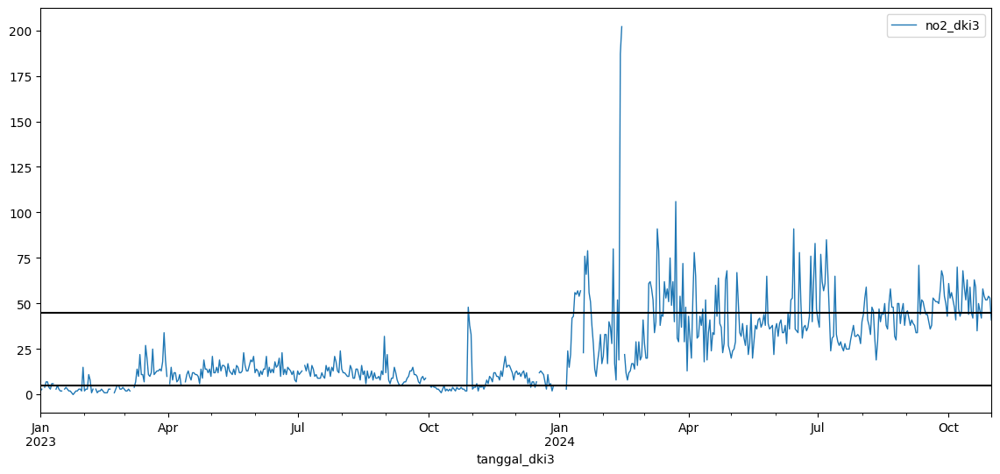

In [506]:
merge_polutan_dki3_temp = merge_polutan_dki3.copy()
merge_polutan_dki3_temp['tanggal_dki3'] = pd.to_datetime(merge_polutan_dki3_temp['tanggal_dki3'])
merge_polutan_dki3_temp = merge_polutan_dki3_temp.set_index('tanggal_dki3')

merge_polutan_dki3_temp.plot(y='pm10_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki3_temp.plot(y='pm25_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki3_temp.plot(y='so2_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki3_temp.plot(y='co_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki3_temp.plot(y='o3_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki3_temp.plot(y='no2_dki3', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 4

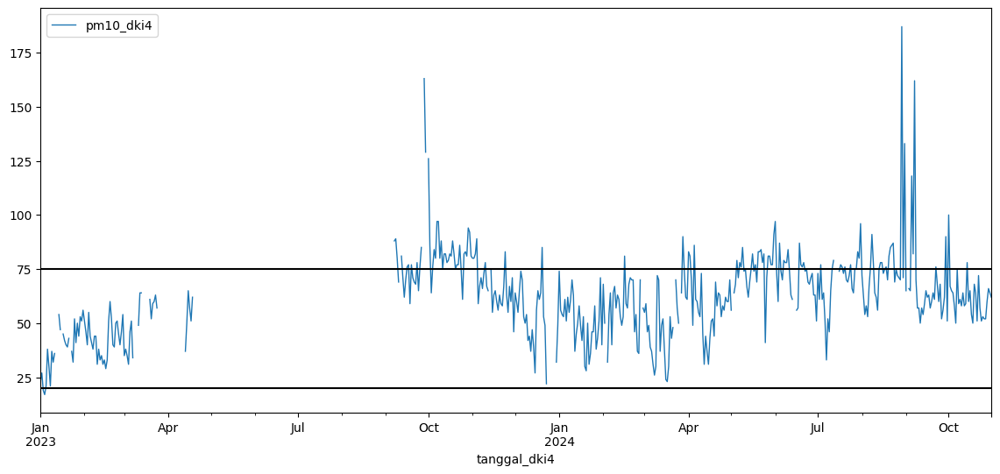

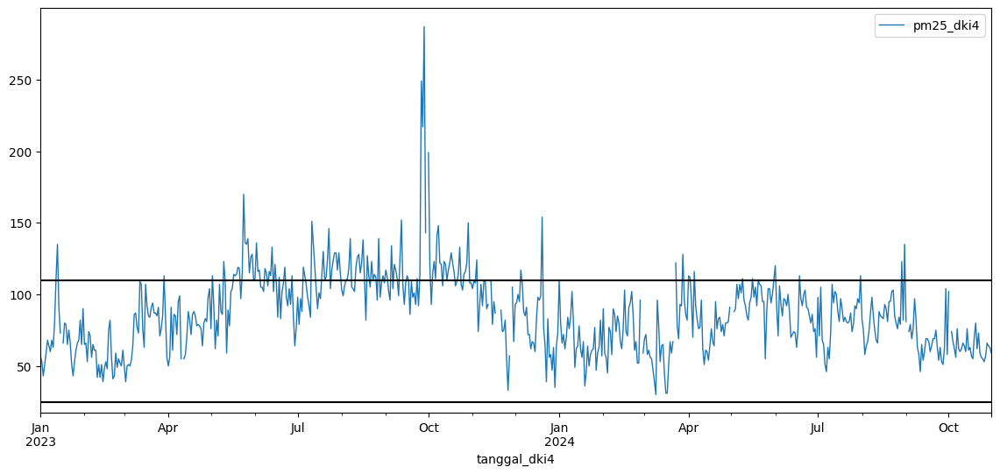

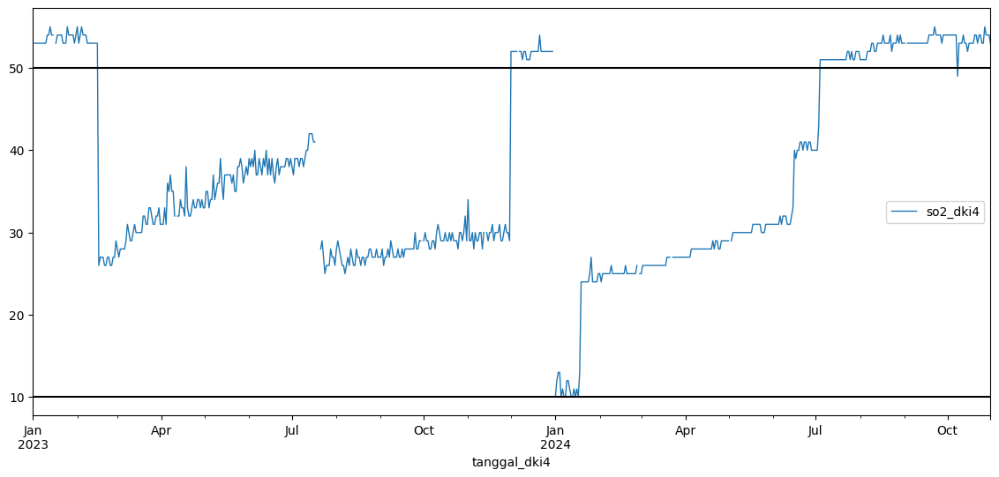

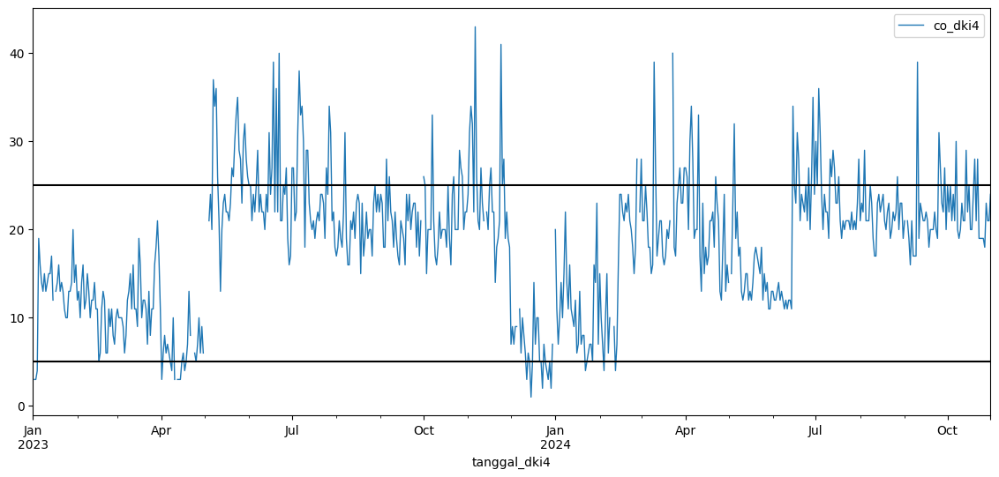

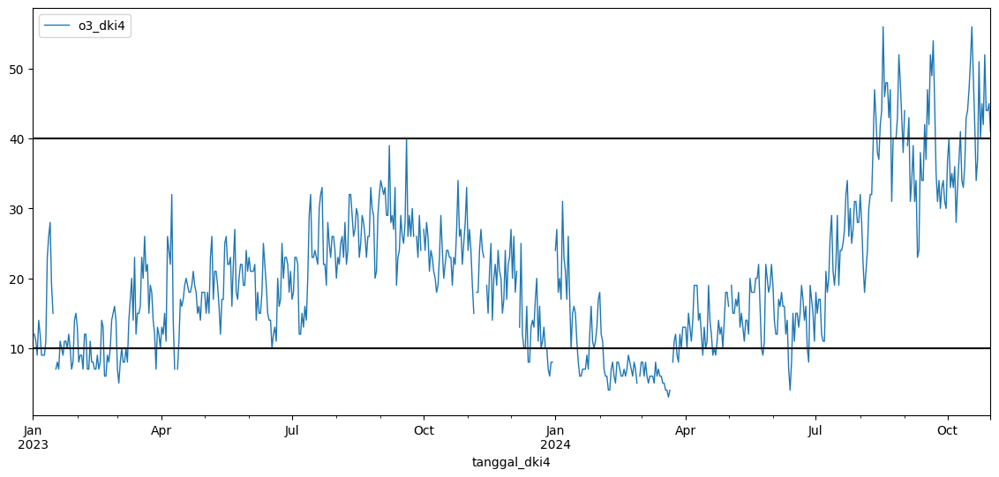

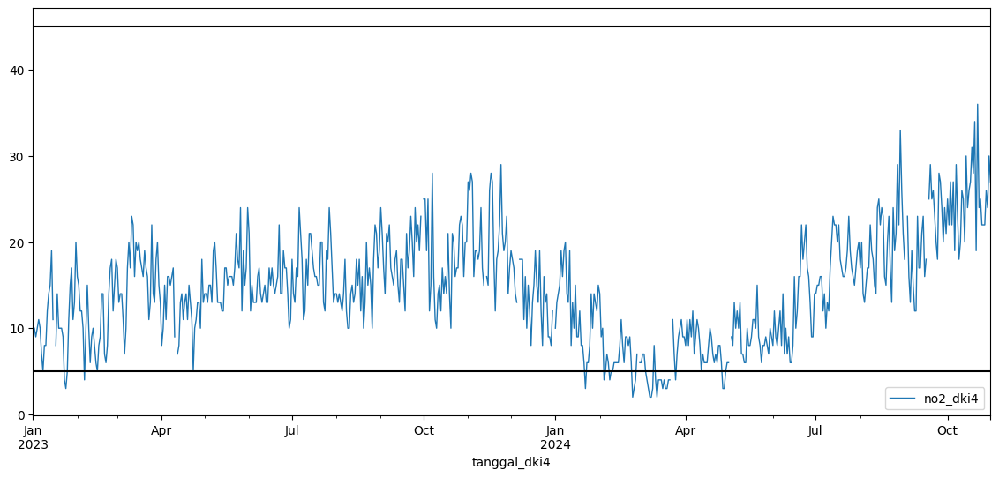

In [507]:
merge_polutan_dki4_temp = merge_polutan_dki4.copy()
merge_polutan_dki4_temp['tanggal_dki4'] = pd.to_datetime(merge_polutan_dki4_temp['tanggal_dki4'])
merge_polutan_dki4_temp = merge_polutan_dki4_temp.set_index('tanggal_dki4')

merge_polutan_dki4_temp.plot(y='pm10_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki4_temp.plot(y='pm25_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki4_temp.plot(y='so2_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki4_temp.plot(y='co_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki4_temp.plot(y='o3_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki4_temp.plot(y='no2_dki4', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

#### DKI 5

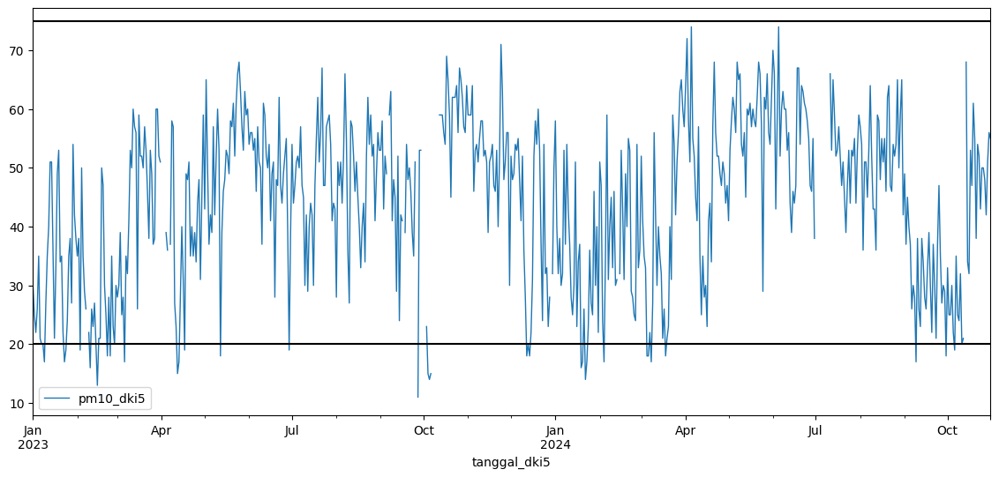

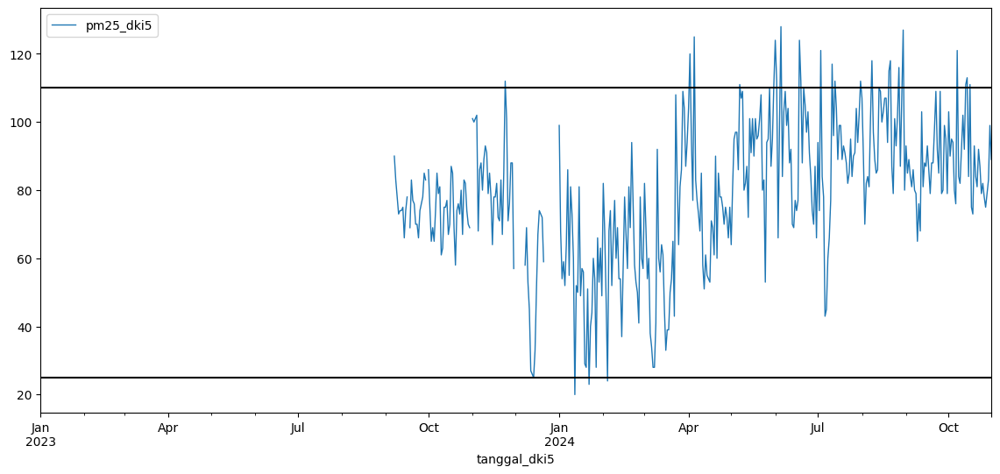

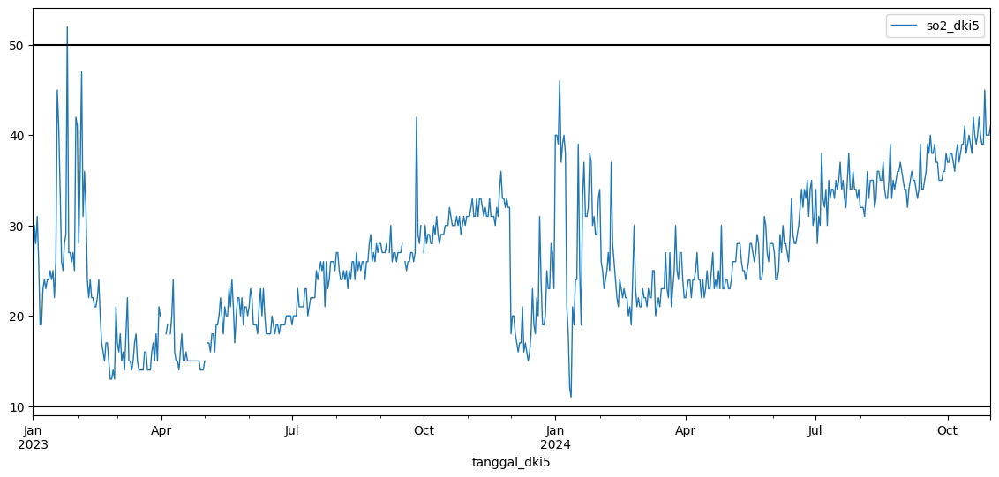

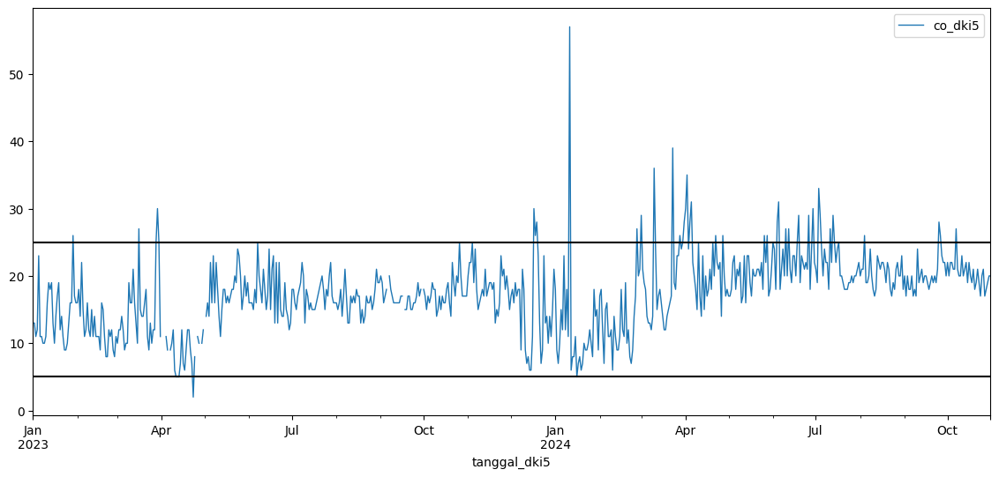

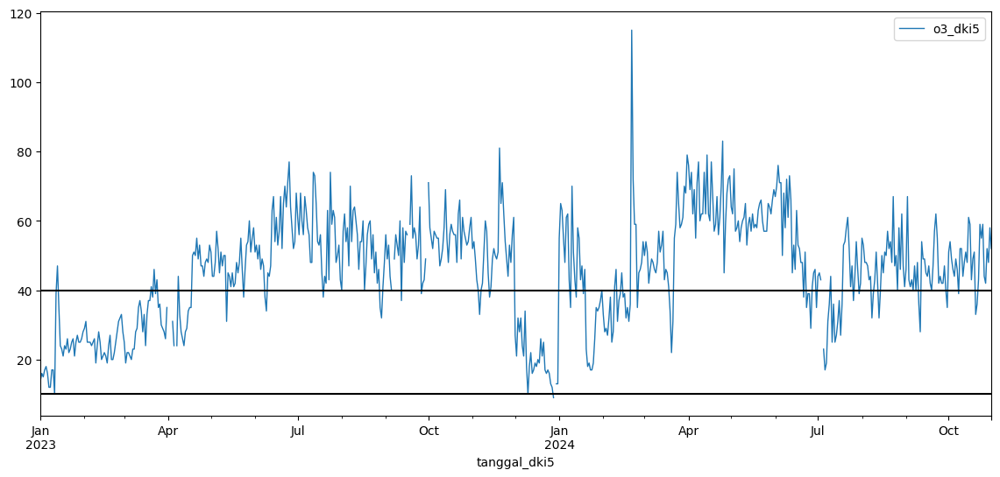

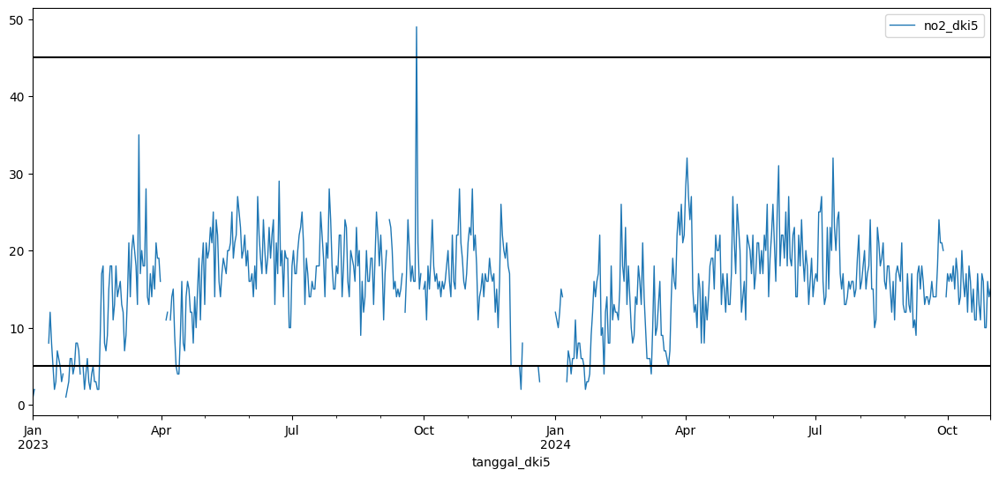

In [508]:
merge_polutan_dki5_temp = merge_polutan_dki5.copy()
merge_polutan_dki5_temp['tanggal_dki5'] = pd.to_datetime(merge_polutan_dki5_temp['tanggal_dki5'])
merge_polutan_dki5_temp = merge_polutan_dki5_temp.set_index('tanggal_dki5')

merge_polutan_dki5_temp.plot(y='pm10_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=75, color='black')
plt.axhline(y=20, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=25, ymax=32, colors='red')

merge_polutan_dki5_temp.plot(y='pm25_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=110, color='black')
plt.axhline(y=25, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=55, ymax=95, colors='red')

merge_polutan_dki5_temp.plot(y='so2_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=50, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=200, colors='red')

merge_polutan_dki5_temp.plot(y='co_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=25, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=10, colors='red')

merge_polutan_dki5_temp.plot(y='o3_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=40, color='black')
plt.axhline(y=10, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')

merge_polutan_dki5_temp.plot(y='no2_dki5', figsize=(14,6), linewidth=1)
plt.axhline(y=45, color='black')
plt.axhline(y=5, color='black')
# plt.vlines(x=['2021-01-01', '2022-01-01', '2023-01-01', '2024-01-01'], ymin=0, ymax=5, colors='red')
plt.show()

Analisis 2021-2024
1. PM10
- semua memiliki seasonality yang sama, namun tidak ada trend
- dki4 memiliki missing value terbanyak

2. PM2.5
- semua memiliki seasonality yang sama, namun tidak ada trend
- dki5 memiliki missing value terbanyak

3. SO2:
- DKI1: memiliki trend yang berbeda tiap tahun
- DKI2: memiliki seasonality untuk naik turun pada beberapa Waktu
- DKI3: memiliki trend menaik pada 2023-2024 & nilai fluktuatif sepanjang tahun
- DKI4: hanya memiliki trend yang menetap 2023 - mid 2024 & fluktuasi pada periode tersebut
- DKI5: memiliki trend menaik setiap tahun

hampir tidak kelihatan kemiripan nilai SO2 pada setiap wilayah dan juga masing" DKI mempunyai fluktuasi yang berbeda"

4. CO:
- DKI1, DKI4, DKI5 memiliki pola CO yang mirip
- DKI2, DKI3 memiliki pola CO yang mirip

5. O3: setiap stasiun memiliki trend & seasonality yang mirip dengan variasi intensitas O3 pada beberapa Waktu & setiap stasiun

6. NO2:
- DKI1, DKI4, DKI5 memiliki trend naik & turun pada Waktu yang mirip
- DKI2: tidak memiliki trend, hanya fluktuasi pada sekitar Q1 2024
- DKI3: 2021-2023 tidak memiliki trend, namun terjadi kenaikan NO2 sepanjang tahun 2024

### Menggabungkan semua data polutan ke axis y

In [509]:
all_merge_polutan = pd.concat([merge_polutan_dki1, merge_polutan_dki2, merge_polutan_dki3, merge_polutan_dki4, merge_polutan_dki5], axis=1)

In [510]:
all_merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 670 entries, 0 to 669
Data columns (total 35 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   tanggal       670 non-null    object 
 1   pm10_dki1     666 non-null    float64
 2   pm25_dki1     664 non-null    float64
 3   so2_dki1      661 non-null    float64
 4   co_dki1       653 non-null    float64
 5   o3_dki1       666 non-null    float64
 6   no2_dki1      666 non-null    float64
 7   tanggal_dki2  670 non-null    object 
 8   pm10_dki2     657 non-null    float64
 9   pm25_dki2     666 non-null    float64
 10  so2_dki2      660 non-null    float64
 11  co_dki2       666 non-null    float64
 12  o3_dki2       666 non-null    float64
 13  no2_dki2      662 non-null    float64
 14  tanggal_dki3  670 non-null    object 
 15  pm10_dki3     654 non-null    float64
 16  pm25_dki3     656 non-null    float64
 17  so2_dki3      665 non-null    float64
 18  co_dki3       664 non-null    

In [511]:
all_merge_polutan = all_merge_polutan.drop(['tanggal_dki2', 'tanggal_dki3', 'tanggal_dki4', 'tanggal_dki5'], axis=1)
all_merge_polutan = all_merge_polutan.set_index('tanggal')

In [512]:
all_merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 670 entries, 2023-01-01 00:00:00.000000 to 2024-10-31 00:00:00.000000
Data columns (total 30 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   pm10_dki1  666 non-null    float64
 1   pm25_dki1  664 non-null    float64
 2   so2_dki1   661 non-null    float64
 3   co_dki1    653 non-null    float64
 4   o3_dki1    666 non-null    float64
 5   no2_dki1   666 non-null    float64
 6   pm10_dki2  657 non-null    float64
 7   pm25_dki2  666 non-null    float64
 8   so2_dki2   660 non-null    float64
 9   co_dki2    666 non-null    float64
 10  o3_dki2    666 non-null    float64
 11  no2_dki2   662 non-null    float64
 12  pm10_dki3  654 non-null    float64
 13  pm25_dki3  656 non-null    float64
 14  so2_dki3   665 non-null    float64
 15  co_dki3    664 non-null    float64
 16  o3_dki3    664 non-null    float64
 17  no2_dki3   647 non-null    float64
 18  pm10_dki4  479 non-null    float64
 19  pm25_dk

### Visualization Bivariate

In [513]:
all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,...,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
tanggal,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00.000000,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,...,NaN,NaN,NaN,NaN,30.0,NaN,21.0,13.0,14.0,1.0
2023-01-02 00:00:00.000000,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,...,53.0,3.0,12.0,10.0,25.0,NaN,30.0,13.0,16.0,2.0
2023-01-03 00:00:00.000000,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,...,53.0,3.0,11.0,9.0,22.0,NaN,28.0,11.0,15.0,NaN
2023-01-04 00:00:00.000000,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,...,53.0,4.0,9.0,10.0,26.0,NaN,31.0,12.0,17.0,2.0
2023-01-05 00:00:00.000000,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,...,53.0,19.0,14.0,11.0,35.0,NaN,26.0,23.0,18.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-27 00:00:00.000000,54.0,78.0,19.0,23.0,34.0,31.0,58.0,77.0,61.0,11.0,...,55.0,18.0,52.0,22.0,48.0,75.0,45.0,17.0,42.0,10.0
2024-10-28 00:00:00.000000,60.0,83.0,10.0,26.0,37.0,36.0,64.0,90.0,60.0,13.0,...,54.0,23.0,44.0,26.0,42.0,79.0,40.0,18.0,52.0,10.0
2024-10-29 00:00:00.000000,59.0,75.0,11.0,28.0,29.0,41.0,65.0,86.0,60.0,14.0,...,54.0,21.0,44.0,24.0,51.0,83.0,40.0,19.0,48.0,16.0


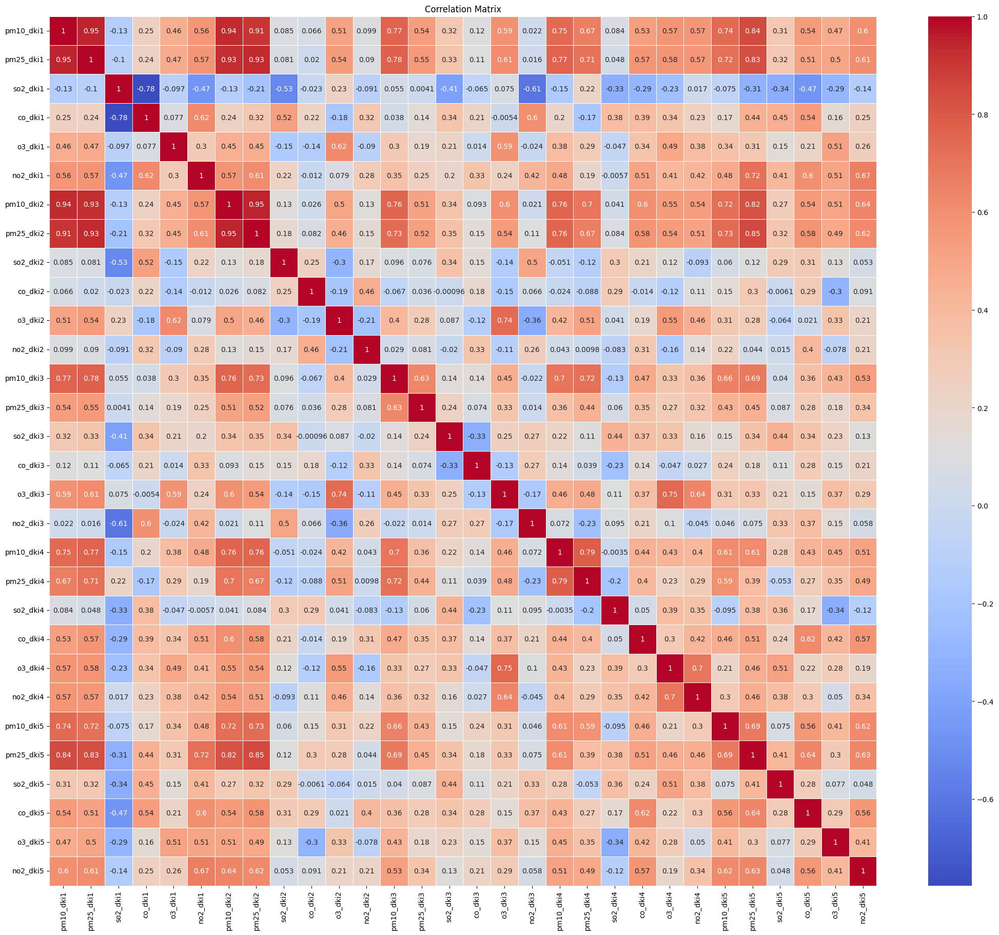

In [514]:
# Create a heatmap
plt.figure(figsize=(26, 22))
sns.heatmap(all_merge_polutan.loc[:, all_merge_polutan.columns != 'tanggal'].corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

### Cek Missing Value

1. cek berapa banyak baris yang mengandung missing values
2. cek berapa banyak baris yang seluruh datanya kosong
3. melihat berapa banyak baris dimana stasiun tidak memiliki pengukuran
4. melihat stasiun apa yang paling banyak mengandung missing values


#### 1. cek berapa banyak baris yang mengandung missing values

In [515]:
#1. cek berapa banyak baris yang mengandung missing values
all_merge_polutan[all_merge_polutan.isna().any(axis=1)]

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,...,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
tanggal,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00.000000,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,...,NaN,NaN,NaN,NaN,30.0,NaN,21.0,13.0,14.0,1.0
2023-01-02 00:00:00.000000,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,...,53.0,3.0,12.0,10.0,25.0,NaN,30.0,13.0,16.0,2.0
2023-01-03 00:00:00.000000,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,...,53.0,3.0,11.0,9.0,22.0,NaN,28.0,11.0,15.0,NaN
2023-01-04 00:00:00.000000,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,...,53.0,4.0,9.0,10.0,26.0,NaN,31.0,12.0,17.0,2.0
2023-01-05 00:00:00.000000,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,...,53.0,19.0,14.0,11.0,35.0,NaN,26.0,23.0,18.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-09-11 00:00:00.000000,39.0,58.0,12.0,23.0,26.0,33.0,47.0,63.0,59.0,9.0,...,53.0,19.0,24.0,17.0,26.0,68.0,34.0,19.0,28.0,18.0
2024-09-17 00:00:00.000000,55.0,79.0,14.0,24.0,40.0,37.0,65.0,87.0,59.0,11.0,...,53.0,21.0,47.0,NaN,33.0,86.0,39.0,19.0,47.0,14.0
2024-09-29 00:00:00.000000,60.0,89.0,12.0,32.0,20.0,39.0,61.0,80.0,58.0,12.0,...,54.0,27.0,31.0,24.0,29.0,95.0,36.0,22.0,40.0,NaN


#### 2. cek berapa banyak baris yang seluruh datanya kosong

In [516]:
#2. cek berapa banyak baris yang seluruh datanya kosong
all_merge_polutan[all_merge_polutan.isna().all(axis=1)]

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,...,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5
tanggal,,,,,,,,,,,,,,,,,,,,,
2023-09-30 00:00:00.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**2023-2024: 47.01% rows containing missing values**

total rows: 670

contains null: 355


**2021-2024: 51.94% rows containing missing values**

total data: 1035

baris yang mengandung null values: 548  

#### 3. melihat berapa banyak baris dimana stasiun tidak memiliki pengukuran

In [517]:
#3. melihat berapa banyak baris dimana stasiun tidak memiliki pengukuran
complete_null_polutan_dki1 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI1')]
complete_null_polutan_dki2 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI2')]
complete_null_polutan_dki3 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI3')]
complete_null_polutan_dki4 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI4')]
complete_null_polutan_dki5 = merge_polutan[(merge_polutan[['pm10', 'pm25', 'so2', 'co', 'o3', 'no2']].isnull().all(axis=1)) & (merge_polutan['stasiun'] == 'DKI5')]


In [518]:
complete_null_polutan_dki1

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
403,2023-03-22,DKI1,NaN,NaN,NaN,NaN,NaN,NaN
405,2023-03-23,DKI1,NaN,NaN,NaN,NaN,NaN,NaN
411,2023-03-24,DKI1,NaN,NaN,NaN,NaN,NaN,NaN
1360,2023-09-30,DKI1,NaN,NaN,NaN,NaN,NaN,NaN


In [519]:
complete_null_polutan_dki2

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
643,2023-05-09,DKI2,NaN,NaN,NaN,NaN,NaN,NaN
1361,2023-09-30,DKI2,NaN,NaN,NaN,NaN,NaN,NaN
2072,2024-02-19,DKI2,NaN,NaN,NaN,NaN,NaN,NaN


In [520]:
complete_null_polutan_dki3

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
54,2023-01-11,DKI3,NaN,NaN,NaN,NaN,NaN,NaN
192,2023-02-08,DKI3,NaN,NaN,NaN,NaN,NaN,NaN
927,2023-07-05,DKI3,NaN,NaN,NaN,NaN,NaN,NaN
1362,2023-09-30,DKI3,NaN,NaN,NaN,NaN,NaN,NaN


In [521]:
complete_null_polutan_dki4

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
75,2023-01-16,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
503,2023-04-11,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
1363,2023-09-30,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
1583,2023-11-13,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
2115,2024-02-28,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
2232,2024-03-22,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
2436,2024-05-02,DKI4,NaN,NaN,NaN,NaN,NaN,NaN
3053,2024-09-02,DKI4,NaN,NaN,NaN,NaN,NaN,NaN


In [522]:
complete_null_polutan_dki5

,tanggal,stasiun,pm10,pm25,so2,co,o3,no2
452,2023-04-01,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
459,2023-04-02,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
464,2023-04-03,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
477,2023-04-06,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
1244,2023-09-06,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
1299,2023-09-17,DKI5,NaN,NaN,NaN,NaN,NaN,NaN
1364,2023-09-30,DKI5,NaN,NaN,NaN,NaN,NaN,NaN


#### 4. melihat stasiun apa yang paling banyak mengandung missing values

In [523]:
#4. melihat stasiun apa yang paling banyak mengandung missing values
null_merge_polutan = merge_polutan[merge_polutan.isnull().any(axis=1)]

count_null_merge_polutan = pysqldf(
"""
  select 
    stasiun, 
    sum(case when pm10 is null then 1 else 0 end) as pm10,
    sum(case when pm25 is null then 1 else 0 end) as pm25,
    sum(case when so2 is null then 1 else 0 end) as so2,
    sum(case when co is null then 1 else 0 end) as co,
    sum(case when o3 is null then 1 else 0 end) as o3,
    sum(case when no2 is null then 1 else 0 end) as no2
  from null_merge_polutan
  group by stasiun
"""
)

count_null_merge_polutan

,stasiun,pm10,pm25,so2,co,o3,no2
0,DKI1,4,6,9,17,4,4
1,DKI2,13,4,10,4,4,8
2,DKI3,16,14,5,6,6,23
3,DKI4,191,14,14,18,13,12
4,DKI5,27,268,8,10,9,38


<Axes: xlabel='stasiun'>

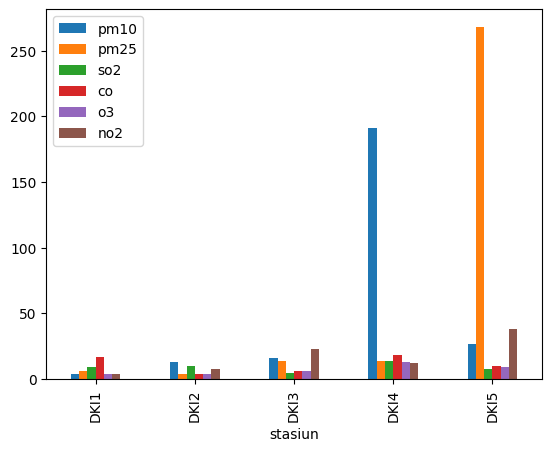

In [524]:
# see null count of every observed pollutant by each region
count_null_merge_polutan.plot(
  x='stasiun',
  kind='bar',
  stacked=False
)

### Proses Missing Values

1. data polutan akan digabung terlebih dahulu dengan data meteorologi, karena Dinas Lingkungan Hidup menyatakan bahwa data meteorologi mempengaruhi perhitungan ispu
2. setelah itu, missing pada data polutan akan diimpute menggunakan KNNImputer
3. dan juga, untuk baris yang semua datanya kosong, akan digunakan linear interpolation untuk imputasinya

In [525]:
pd.set_option("display.max_columns", None)

In [535]:
temp_all_merge_polutan = all_merge_polutan.copy()

temp_all_merge_polutan = temp_all_merge_polutan.reset_index()
temp_all_merge_polutan['tanggal'] = pd.to_datetime(temp_all_merge_polutan['tanggal']).dt.date
temp_all_merge_polutan_index = temp_all_merge_polutan['tanggal']
temp_all_merge_polutan = temp_all_merge_polutan.set_index('tanggal')
temp_all_merge_polutan = temp_all_merge_polutan.join(data_meteorologi)
temp_all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
tanggal,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-01,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,20.0,19.0,26.0,43.0,51.0,5.0,16.0,2.0,23.0,57.0,NaN,NaN,NaN,NaN,30.0,NaN,21.0,13.0,14.0,1.0,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,21.0,19.0,23.0,40.0,51.0,5.0,16.0,3.0,27.0,53.0,53.0,3.0,12.0,10.0,25.0,NaN,30.0,13.0,16.0,2.0,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,21.0,16.0,25.0,32.0,53.0,4.0,15.0,NaN,19.0,43.0,53.0,3.0,11.0,9.0,22.0,NaN,28.0,11.0,15.0,NaN,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,21.0,26.0,30.0,44.0,53.0,5.0,15.0,4.0,17.0,51.0,53.0,4.0,9.0,10.0,26.0,NaN,31.0,12.0,17.0,2.0,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,21.0,35.0,40.0,59.0,53.0,10.0,18.0,7.0,21.0,59.0,53.0,19.0,14.0,11.0,35.0,NaN,26.0,23.0,18.0,NaN,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-27,54.0,78.0,19.0,23.0,34.0,31.0,58.0,77.0,61.0,11.0,32.0,19.0,44.0,72.0,66.0,8.0,29.0,52.0,52.0,57.0,55.0,18.0,52.0,22.0,48.0,75.0,45.0,17.0,42.0,10.0,30.1,71.0,0.0,8.0,2.0,1.0,30.2,74.0,0.0,8.0,2.0,6.0
2024-10-28,60.0,83.0,10.0,26.0,37.0,36.0,64.0,90.0,60.0,13.0,30.0,22.0,58.0,87.0,64.0,10.0,28.0,52.0,60.0,66.0,54.0,23.0,44.0,26.0,42.0,79.0,40.0,18.0,52.0,10.0,30.2,67.0,0.0,8.0,1.0,1.0,30.1,71.0,0.0,8.0,1.0,1.0
2024-10-29,59.0,75.0,11.0,28.0,29.0,41.0,65.0,86.0,60.0,14.0,31.0,29.0,45.0,11.0,64.0,10.0,28.0,54.0,66.0,64.0,54.0,21.0,44.0,24.0,51.0,83.0,40.0,19.0,48.0,16.0,30.8,69.0,0.0,0.6,1.0,1.0,30.7,72.0,0.0,5.2,1.0,1.0


In [536]:
data_meteorologi

,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
Tanggal,,,,,,,,,,,,
2023-01-01,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-27,29.2,78.0,7.5,1.2,2.0,1.0,29.2,81.0,11.1,4.6,3.0,8.0
2024-12-28,30.0,70.0,0.6,3.8,2.0,1.0,29.6,79.0,0.0,7.3,2.0,9.0
2024-12-29,29.7,73.0,0.0,3.0,1.0,1.0,29.3,81.0,7.7,5.9,3.0,8.0


In [537]:
temp_all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
tanggal,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-01,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,20.0,19.0,26.0,43.0,51.0,5.0,16.0,2.0,23.0,57.0,NaN,NaN,NaN,NaN,30.0,NaN,21.0,13.0,14.0,1.0,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,21.0,19.0,23.0,40.0,51.0,5.0,16.0,3.0,27.0,53.0,53.0,3.0,12.0,10.0,25.0,NaN,30.0,13.0,16.0,2.0,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,21.0,16.0,25.0,32.0,53.0,4.0,15.0,NaN,19.0,43.0,53.0,3.0,11.0,9.0,22.0,NaN,28.0,11.0,15.0,NaN,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,21.0,26.0,30.0,44.0,53.0,5.0,15.0,4.0,17.0,51.0,53.0,4.0,9.0,10.0,26.0,NaN,31.0,12.0,17.0,2.0,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,21.0,35.0,40.0,59.0,53.0,10.0,18.0,7.0,21.0,59.0,53.0,19.0,14.0,11.0,35.0,NaN,26.0,23.0,18.0,NaN,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-27,54.0,78.0,19.0,23.0,34.0,31.0,58.0,77.0,61.0,11.0,32.0,19.0,44.0,72.0,66.0,8.0,29.0,52.0,52.0,57.0,55.0,18.0,52.0,22.0,48.0,75.0,45.0,17.0,42.0,10.0,30.1,71.0,0.0,8.0,2.0,1.0,30.2,74.0,0.0,8.0,2.0,6.0
2024-10-28,60.0,83.0,10.0,26.0,37.0,36.0,64.0,90.0,60.0,13.0,30.0,22.0,58.0,87.0,64.0,10.0,28.0,52.0,60.0,66.0,54.0,23.0,44.0,26.0,42.0,79.0,40.0,18.0,52.0,10.0,30.2,67.0,0.0,8.0,1.0,1.0,30.1,71.0,0.0,8.0,1.0,1.0
2024-10-29,59.0,75.0,11.0,28.0,29.0,41.0,65.0,86.0,60.0,14.0,31.0,29.0,45.0,11.0,64.0,10.0,28.0,54.0,66.0,64.0,54.0,21.0,44.0,24.0,51.0,83.0,40.0,19.0,48.0,16.0,30.8,69.0,0.0,0.6,1.0,1.0,30.7,72.0,0.0,5.2,1.0,1.0


In [538]:
imputer = KNNImputer()
imputed_all_merge_polutan = imputer.fit_transform(temp_all_merge_polutan)

In [540]:
# temp_all_merge_polutan = temp_all_merge_polutan.reset_index()
imputed_all_merge_polutan = pd.DataFrame(imputed_all_merge_polutan, columns=temp_all_merge_polutan.columns, index=temp_all_merge_polutan_index)

In [541]:
imputed_all_merge_polutan

,pm10_dki1,pm25_dki1,so2_dki1,co_dki1,o3_dki1,no2_dki1,pm10_dki2,pm25_dki2,so2_dki2,co_dki2,o3_dki2,no2_dki2,pm10_dki3,pm25_dki3,so2_dki3,co_dki3,o3_dki3,no2_dki3,pm10_dki4,pm25_dki4,so2_dki4,co_dki4,o3_dki4,no2_dki4,pm10_dki5,pm25_dki5,so2_dki5,co_dki5,o3_dki5,no2_dki5,Tavg_km,RH_avg_km,RR_km,ss_km,ff_avg_km,DDD_CAR_km,Tavg_tp,RH_avg_tp,RR_tp,ss_tp,ff_avg_tp,DDD_CAR_tp
tanggal,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-01-01,44.0,55.0,47.0,10.0,24.0,9.0,44.0,61.0,56.0,16.0,20.0,19.0,26.0,43.0,51.0,5.0,16.0,2.0,23.0,57.0,47.4,10.0,10.8,10.8,30.0,54.4,21.0,13.0,14.0,1.0,26.3,87.0,14.5,0.0,1.0,1.0,25.9,93.0,38.0,1.3,2.0,1.0
2023-01-02,32.0,43.0,52.0,9.0,24.0,8.0,34.0,43.0,59.0,15.0,21.0,19.0,23.0,40.0,51.0,5.0,16.0,3.0,27.0,53.0,53.0,3.0,12.0,10.0,25.0,51.4,30.0,13.0,16.0,2.0,27.5,81.0,31.5,0.7,2.0,9.0,27.2,88.0,134.4,0.1,3.0,8.0
2023-01-03,31.0,35.0,49.0,9.0,12.0,7.0,28.0,34.0,57.0,13.0,21.0,16.0,25.0,32.0,53.0,4.0,15.0,2.2,19.0,43.0,53.0,3.0,11.0,9.0,22.0,30.2,28.0,11.0,15.0,4.2,26.6,82.0,0.5,0.0,1.0,1.0,26.7,83.0,0.7,1.1,2.0,8.0
2023-01-04,30.0,47.0,53.0,11.0,15.0,9.0,31.0,49.0,60.0,17.0,21.0,26.0,30.0,44.0,53.0,5.0,15.0,4.0,17.0,51.0,53.0,4.0,9.0,10.0,26.0,37.8,31.0,12.0,17.0,2.0,26.4,86.0,2.4,2.1,1.0,1.0,27.0,88.0,3.2,0.1,2.0,8.0
2023-01-05,38.0,50.0,50.0,13.0,26.0,11.0,37.0,53.0,57.0,26.0,21.0,35.0,40.0,59.0,53.0,10.0,18.0,7.0,21.0,59.0,53.0,19.0,14.0,11.0,35.0,54.4,26.0,23.0,18.0,5.6,27.4,83.0,35.3,4.9,2.0,1.0,27.5,84.0,31.3,3.5,3.0,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-27,54.0,78.0,19.0,23.0,34.0,31.0,58.0,77.0,61.0,11.0,32.0,19.0,44.0,72.0,66.0,8.0,29.0,52.0,52.0,57.0,55.0,18.0,52.0,22.0,48.0,75.0,45.0,17.0,42.0,10.0,30.1,71.0,0.0,8.0,2.0,1.0,30.2,74.0,0.0,8.0,2.0,6.0
2024-10-28,60.0,83.0,10.0,26.0,37.0,36.0,64.0,90.0,60.0,13.0,30.0,22.0,58.0,87.0,64.0,10.0,28.0,52.0,60.0,66.0,54.0,23.0,44.0,26.0,42.0,79.0,40.0,18.0,52.0,10.0,30.2,67.0,0.0,8.0,1.0,1.0,30.1,71.0,0.0,8.0,1.0,1.0
2024-10-29,59.0,75.0,11.0,28.0,29.0,41.0,65.0,86.0,60.0,14.0,31.0,29.0,45.0,11.0,64.0,10.0,28.0,54.0,66.0,64.0,54.0,21.0,44.0,24.0,51.0,83.0,40.0,19.0,48.0,16.0,30.8,69.0,0.0,0.6,1.0,1.0,30.7,72.0,0.0,5.2,1.0,1.0


In [542]:
imputed_all_merge_polutan.to_csv('./preprocessed_main_data.csv')

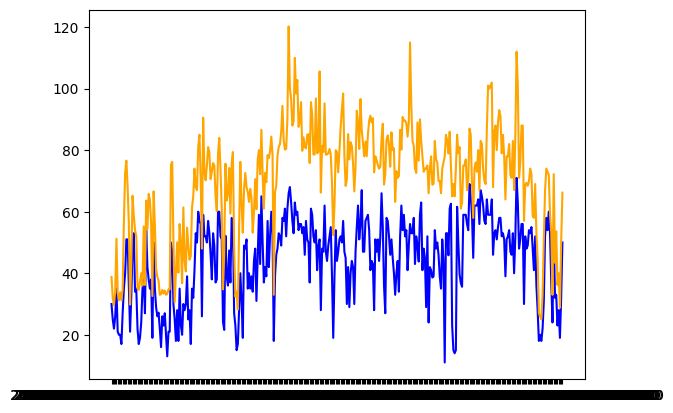

In [164]:
# impute without meteorological
plt.plot(imputed_all_merge_polutan.loc[(imputed_all_merge_polutan.index >= '2023-01') & (imputed_all_merge_polutan.index < '2024-01'), 'pm10_dki5'], label='pm10_dki5', c='blue')
plt.plot(imputed_all_merge_polutan.loc[(imputed_all_merge_polutan.index >= '2023-01') & (imputed_all_merge_polutan.index < '2024-01'), 'pm25_dki5'], label='pm25_dki5', c='orange')


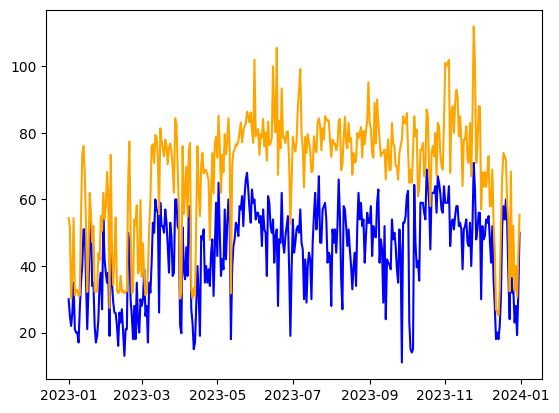

In [1226]:
# impute with meteorological
plt.plot(imputed_all_merge_polutan.loc[imputed_all_merge_polutan.index < date(2024, 1, 1), 'pm10_dki5'], label='pm10_dki5', c='blue')
plt.plot(imputed_all_merge_polutan.loc[imputed_all_merge_polutan.index < date(2024, 1, 1), 'pm25_dki5'], label='pm25_dki5', c='orange')

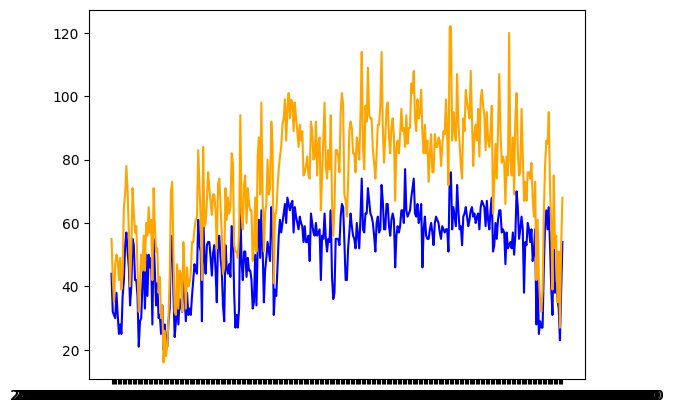

In [165]:
plt.plot(imputed_all_merge_polutan.loc[(imputed_all_merge_polutan.index >= '2023-01') & (imputed_all_merge_polutan.index < '2024-01'), 'pm10_dki1'], label='pm10_dki1', c='blue')
plt.plot(imputed_all_merge_polutan.loc[(imputed_all_merge_polutan.index >= '2023-01') & (imputed_all_merge_polutan.index < '2024-01'), 'pm25_dki1'], label='pm25_dki1', c='orange')


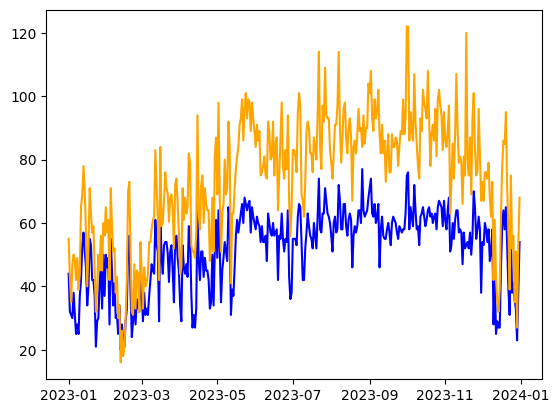

In [1227]:
# impute with meteorological
plt.plot(imputed_all_merge_polutan.loc[imputed_all_merge_polutan.index < date(2024, 1, 1), 'pm10_dki1'], label='pm10_dki1', c='blue')
plt.plot(imputed_all_merge_polutan.loc[imputed_all_merge_polutan.index < date(2024, 1, 1), 'pm25_dki1'], label='pm25_dki1', c='orange')

In [1228]:
imputed_all_merge_polutan.info()

<class 'pandas.core.frame.DataFrame'>
Index: 670 entries, 2023-01-01 to 2024-10-31
Data columns (total 42 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   pm10_dki1   670 non-null    float64
 1   pm25_dki1   670 non-null    float64
 2   so2_dki1    670 non-null    float64
 3   co_dki1     670 non-null    float64
 4   o3_dki1     670 non-null    float64
 5   no2_dki1    670 non-null    float64
 6   pm10_dki2   670 non-null    float64
 7   pm25_dki2   670 non-null    float64
 8   so2_dki2    670 non-null    float64
 9   co_dki2     670 non-null    float64
 10  o3_dki2     670 non-null    float64
 11  no2_dki2    670 non-null    float64
 12  pm10_dki3   670 non-null    float64
 13  pm25_dki3   670 non-null    float64
 14  so2_dki3    670 non-null    float64
 15  co_dki3     670 non-null    float64
 16  o3_dki3     670 non-null    float64
 17  no2_dki3    670 non-null    float64
 18  pm10_dki4   670 non-null    float64
 19  pm25_dki4   670 no

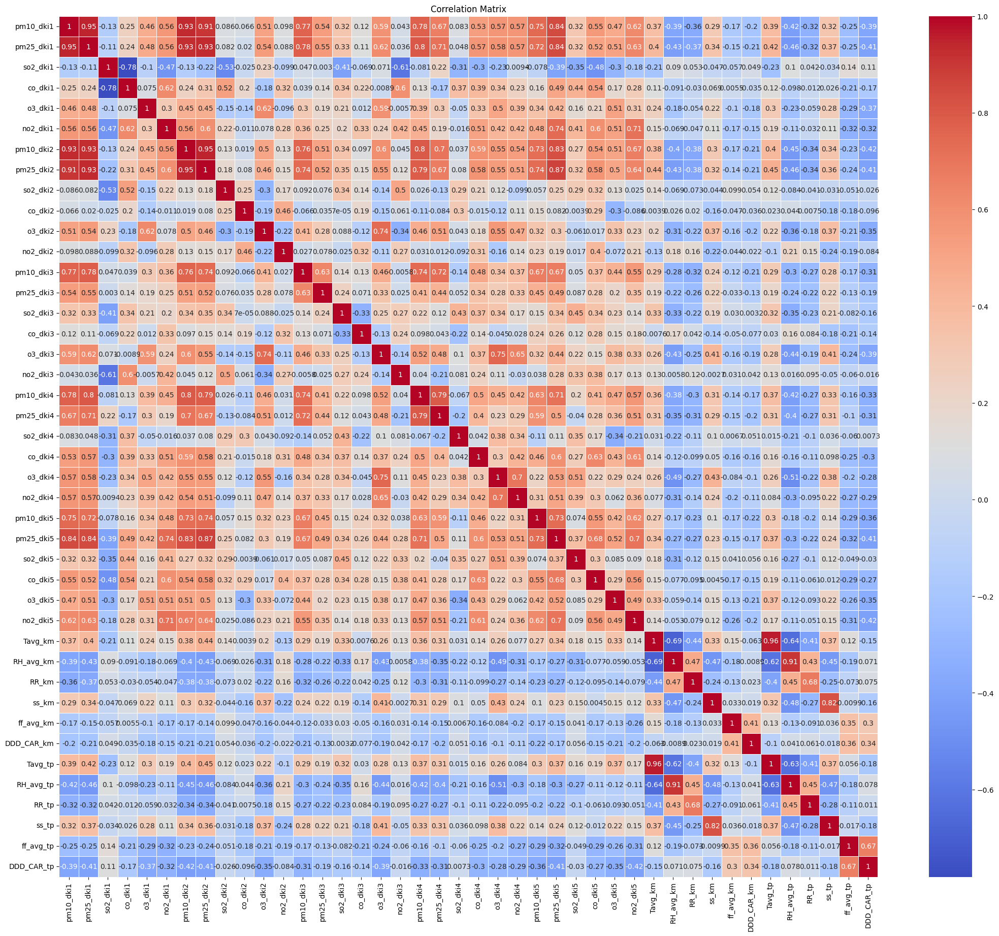

In [1393]:
# Create a heatmap
plt.figure(figsize=(26, 22))
sns.heatmap(imputed_all_merge_polutan.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()